Presentation Link: https://drive.google.com/file/d/15ON_RpKPV64RQFaYZwQUWTorUpQpcxAU/view?usp=sharing

Dash Board Link: https://public.tableau.com/views/SalesoutletPerformance/Dashboard1?:language=en-US&publish=yes&:display_count=n&:origin=viz_share_link

# Retail: Assess Sales Outlets' Performance Decomposition

### Define the Goal

   * What do you want to achieve and why?
   
   
   * Who's interested in what you produce?
   
   
   * What decisions will be made based on your analysis?


**What do you want to achieve and why?**

   * Find the relationship between revenue growth and the probability of churn.
   * Identify the relationship between payment frequency and the probability of churn.
   * Compare the time since the last purchase with the probability of churn.
   * Find the share of members and non members of loyality program.
   * Find the retention of the cohort.
   * Find purchases conducted daily, weekly and monthly.
   * Calculate daily, weekly and monthly revenue.
   * Find out week over week growth of revenue.
   * Find out month over month growth of revenue.


**Who's interested in what you produce?**

   * The Home World company in general and the Marketing department in particular.
   
   * Interested customers.

**What decisions will be made based on your analysis?**

   * To decide whether to continue the loyalty program or not.
   
   * To confirm whether the loyal customers are satisfied by the loyalty company or not.

### Specify Details


Task: Determine the probability that a customer will leave based on their behavior.

### Propose Hypotheses

   * Loyal customers show lower growth dynamics than average for the sample.
   
   
   * Loyal customers make payments less often than average.
   
   
   * Loyal customers haven't bought anything for a long time.
   
   * Find shops with the highest selling.


### Action Plan

Then it follows from the hypotheses that we need to:


   * Look into the relationship between revenue growth and the probability of churn.
   
   
   * Identify the relationship between payment frequency and the probability of churn.
   
   
   * Compare the time since the last purchase with the probability of churn.


### Description of the data

The dataset contains data on purchases made at the building-material retailer Home World. All of its customers have membership cards. Moreover, they can become members of the store's loyalty program for $20 per month. The program includes discounts, information on special offers, and gifts.

`retail_dataset_us.csv` contains the following fields::

- `purchaseId`
- `item_ID`
- `purchasedate`
- `Quantity` — the number of items in the purchase
- `CustomerID`
- `ShopID`
- `loyalty_program` — whether the customer is a member of the loyalty program

`product_codes_us.csv` contains the following fields:

- `productID`
- `price_per_one`

# Step 1. Download the data

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
from datetime import timedelta
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats
import datetime as dt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import warnings
warnings.filterwarnings('ignore')

In [15]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [16]:
try:
    retail = pd.read_csv('https://code.s3.yandex.net/retail_dataset_us.csv')
    product = pd.read_csv('https://code.s3.yandex.net/product_codes_us.csv', sep= ';')
except:    
    retail = pd.read_csv('https://code.s3.yandex.net/datasets/retail_dataset_us.csv')
    product = pd.read_csv('https://code.s3.yandex.net/datasets/product_codes_us.csv', sep= ';')
finally:
    print('Try to read files')
       
retail.head()
product.head()

Try to read files


,productID,price_per_one
0,10002,0.85
1,10080,0.85
2,10120,0.21
3,10123C,0.65
4,10124A,0.42


In [17]:
retail.head()

,purchaseid,item_ID,Quantity,purchasedate,CustomerID,loyalty_program,ShopID
0,538280,21873,11,2016-12-10 12:50:00,18427.0,0,Shop 3
1,538862,22195,0,2016-12-14 14:11:00,22389.0,1,Shop 2
2,538855,21239,7,2016-12-14 13:50:00,22182.0,1,Shop 3
3,543543,22271,0,2017-02-09 15:33:00,23522.0,1,Shop 28
4,543812,79321,0,2017-02-13 14:40:00,23151.0,1,Shop 28


In [18]:
# To know the number of columns and rows in the DataFrame
retail.shape

(105335, 7)

In [19]:
# To know the number of columns and rows in the DataFrame
product.shape

(3159, 2)

In [20]:
# Get information about the DataFrame
retail.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   purchaseid       105335 non-null  object 
 1   item_ID          105335 non-null  object 
 2   Quantity         105335 non-null  int64  
 3   purchasedate     105335 non-null  object 
 4   CustomerID       69125 non-null   float64
 5   loyalty_program  105335 non-null  int64  
 6   ShopID           105335 non-null  object 
dtypes: float64(1), int64(2), object(4)
memory usage: 29.0 MB


In [21]:
# Get information about the DataFrame
product.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3159 entries, 0 to 3158
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   productID      3159 non-null   object 
 1   price_per_one  3159 non-null   float64
dtypes: float64(1), object(1)
memory usage: 217.0 KB


In [22]:
# To check whether column's name are written in appropriate way
retail.columns

Index(['purchaseid', 'item_ID', 'Quantity', 'purchasedate', 'CustomerID',
       'loyalty_program', 'ShopID'],
      dtype='object')

In [23]:
# To check whether column's name are written in appropriate way
product.columns

Index(['productID', 'price_per_one'], dtype='object')

In [24]:
# To get information about statistical character of the DataFrame
retail.describe()

,Quantity,CustomerID,loyalty_program
count,105335.000000,69125.000000,105335.000000
mean,7.821218,21019.302047,0.226345
std,327.946695,1765.444679,0.418467
min,-74216.000000,18025.000000,0.000000
25%,0.000000,19544.000000,0.000000
50%,2.000000,20990.000000,0.000000
75%,7.000000,22659.000000,0.000000
max,74214.000000,23962.000000,1.000000


In [25]:
# To get information about statistical character of the DataFrame
product.describe()

,price_per_one
count,3159.000000
mean,2.954495
std,7.213808
min,0.000000
25%,0.650000
50%,1.450000
75%,3.290000
max,175.000000


In [26]:
# Checking duplicates in the DataFrame
retail.duplicated().sum()

1033

In [27]:
# Checking duplicates in the DataFrame
product.duplicated().sum()

0

In [28]:
# To confirm the missing values of the DataFrame
retail.isna().sum()

purchaseid             0
item_ID                0
Quantity               0
purchasedate           0
CustomerID         36210
loyalty_program        0
ShopID                 0
dtype: int64

In [29]:
# To confirm the missing values of the DataFrame
product.isna().sum()

productID        0
price_per_one    0
dtype: int64

In [30]:
# To get the exact number of missing values
retail['CustomerID'].isnull().sum()

36210

In [31]:
# To get the percentile information of the columns in the dataframe
mis_values = retail.isnull().sum().to_frame('missing_values')
mis_values['%'] = round(retail.isnull().sum()*100/len(retail), 3)
mis_values['%']

purchaseid          0.000
item_ID             0.000
Quantity            0.000
purchasedate        0.000
CustomerID         34.376
loyalty_program     0.000
ShopID              0.000
Name: %, dtype: float64

In [32]:
mis_values.sort_values(by='%', ascending=False)

,missing_values,%
CustomerID,36210,34.376
purchaseid,0,0.000
item_ID,0,0.000
Quantity,0,0.000
purchasedate,0,0.000
loyalty_program,0,0.000
ShopID,0,0.000


In [33]:
# To get the percentile information of the columns in the dataframe
mis_values = product.isnull().sum().to_frame('missing_values')
mis_values['%'] = round(product.isnull().sum()*100/len(product), 3)
mis_values['%']

productID        0.0
price_per_one    0.0
Name: %, dtype: float64

In [34]:
mis_values.sort_values(by='%', ascending=False)

,missing_values,%
productID,0,0.0
price_per_one,0,0.0


In [35]:
# Print a sample of DataFrame
retail.sample(10)

,purchaseid,item_ID,Quantity,purchasedate,CustomerID,loyalty_program,ShopID
32135,540418,85071C,0,2017-01-07 11:04:00,NaN,0,Shop 0
81704,C540165,82486,-2,2017-01-05 12:05:00,23788.0,1,Shop 8
67992,540352,16237,3,2017-01-06 14:27:00,NaN,0,Shop 0
79777,543251,22697,5,2017-02-04 14:51:00,19873.0,0,Shop 11
86796,545060,84378,0,2017-02-27 13:47:00,21226.0,0,Shop 1
83846,544186,22894,0,2017-02-16 15:56:00,NaN,0,Shop 0
93911,543044,82486,1,2017-02-03 08:18:00,22750.0,1,Shop 4
29539,540523,22178,5,2017-01-09 12:51:00,18748.0,0,Shop 5
66610,536557,22835,0,2016-12-01 14:41:00,23520.0,1,Shop 17
29754,538198,21733,1,2016-12-10 11:01:00,23506.0,1,Shop 15


In [36]:
# Print a sample of DataFrame
product.sample(10)

,productID,price_per_one
1432,22577,0.85
1800,22961,1.25
2901,90060F,5.94
2299,84509B,3.29
3151,M,0.19
3106,90210B,1.25
980,22084,2.55
1016,22120,8.50
782,21787,0.65
3047,90180A,9.95


In [37]:
# To check if there are unique values
retail['purchaseid'].unique()

array(['538280', '538862', '538855', ..., '540564', '542572', 'C541650'],
      dtype=object)

In [38]:
# To check if there are unique values
retail['item_ID'].unique()

array(['21873', '22195', '21239', ..., '90053', '17028J', '79320'],
      dtype=object)

In [39]:
# To check if there are unique values
retail['Quantity'].unique()

array([    11,      0,      7,      1,      5,      4,      3,      9,
           35,     23,      2,     71,     -2,    103,      6,     24,
          383,    -25,     18,     19,     95,    143,      8,     47,
           17,     20,     14,    -11,     12,     99,     39,     49,
          239,     25,     31,    -31,     29,    -61,     13,     15,
           28,    -13,     -3,     -8,   -101,    -10,   -940,     59,
          199,     27,     22,    119,    287,     37,     -9,     46,
           -5,    -81,     10,     -4,     -6,    215,    -41,     69,
          -16,    -26,   -724,     -7,   -100,     30,    479,   -193,
          -33,   2399,    -15,    191,     21,     63,    -24,    299,
          -19,   1295,    107,     79,     26,    140,    -17,    -14,
          359,    323,     32,   1007,     48,     64,    179,    251,
          -21,    -37,   1286,    -34,    599,    207,     33,    -36,
           52,   -145,     83,     43,    -54,    -65,     68,    503,
      

In [40]:
# To check if there are unique values
retail['purchasedate'].unique()

array(['2016-12-10 12:50:00', '2016-12-14 14:11:00',
       '2016-12-14 13:50:00', ..., '2016-12-05 13:09:00',
       '2017-01-10 10:36:00', '2017-01-20 11:44:00'], dtype=object)

In [41]:
# To check if there are unique values
retail['CustomerID'].unique()

array([18427., 22389., 22182., ..., 20156., 20358., 23763.])

In [42]:
# To check if there are unique values
retail['loyalty_program'].unique()

array([0, 1])

In [43]:
# To check if there are unique values
retail['ShopID'].unique()

array(['Shop 3', 'Shop 2', 'Shop 28', 'Shop 20', 'Shop 0', 'Shop 1',
       'Shop 6', 'Shop 17', 'Shop 24', 'Shop 18', 'Shop 16', 'Shop 14',
       'Shop 13', 'Shop 30', 'Shop 8', 'Shop 23', 'Shop 12', 'Shop 26',
       'Shop 4', 'Shop 7', 'Shop 10', 'Shop 9', 'Shop 19', 'Shop 5',
       'Shop 29', 'Shop 22', 'Shop 27', 'Shop 21', 'Shop 25', 'Shop 15',
       'Shop 11'], dtype=object)

In [44]:
# To check if there are unique values
product['productID'].unique()

array(['10002', '10080', '10120', ..., 'gift_0001_40', 'gift_0001_50',
       'm'], dtype=object)

In [45]:
# To check if there are unique values
product['price_per_one'].unique()

array([8.500e-01, 2.100e-01, 6.500e-01, 4.200e-01, 1.690e+00, 1.400e-01,
       5.300e-01, 2.950e+00, 4.950e+00, 4.250e+00, 4.600e+00, 1.246e+01,
       7.950e+00, 2.500e-01, 1.200e-01, 3.200e-01, 5.000e-01, 7.200e-01,
       0.000e+00, 5.550e+00, 1.250e+00, 1.600e-01, 2.900e-01, 2.100e+00,
       2.460e+00, 2.400e-01, 7.000e-02, 3.800e-01, 1.700e-01, 2.550e+00,
       1.630e+00, 6.000e-02, 1.950e+00, 5.060e+00, 7.500e-01, 8.300e-01,
       1.000e-01, 1.060e+00, 3.250e+00, 3.750e+00, 3.290e+00, 1.650e+00,
       1.450e+00, 6.350e+00, 4.650e+00, 5.490e+00, 3.995e+01, 6.750e+00,
       2.120e+00, 7.900e-01, 1.102e+01, 9.320e+00, 5.950e+00, 4.210e+00,
       8.470e+00, 5.500e-01, 4.130e+00, 9.500e-01, 2.750e+00, 7.460e+00,
       8.950e+00, 6.400e-01, 1.698e+01, 6.950e+00, 3.390e+00, 3.360e+00,
       1.530e+00, 1.850e+00, 4.000e-01, 7.620e+00, 5.910e+00, 5.790e+00,
       8.500e+00, 8.290e+00, 2.195e+01, 5.450e+00, 1.275e+01, 9.950e+00,
       2.079e+01, 1.050e+00, 1.595e+01, 1.095e+01, 

**Conclusion**


   * There are two datasets, retail and product, in the project.
   * The dataset retail has 105,335 rows and 7 columns.
   * The dataset product has 3159 rows and 2 columns.
   * The datatype of retail dataset are object, int64 and float64 and some of them needs tobe converted into the right datatype.
   * he datatype of product dataset are object and int64.
   * There are 1033 duplicates in the dataset retail where as there are no duplicates in the product dataset.
   * There are 36,210 missing values in the retail dataset in the 'customer_id' column which is 34.34% of the whole data of the retail dataset where as there are no missing values in the product dataset.

# Step 2. Data Preprocessing

For instance, the preprocessing stage can be divided into substages:

   * Study missing values
   
   * Study type correspondence
   
   * Study duplicate values
   
   * Check the correctness of column names
   
   * Rename the columns
   
   * Remove duplicates
   
   * Convert types
   
   * Replace missing values


**Check the correctness of column names and 
Rename the columns**

In [46]:
# Columns of the Data Frame
retail.columns

Index(['purchaseid', 'item_ID', 'Quantity', 'purchasedate', 'CustomerID',
       'loyalty_program', 'ShopID'],
      dtype='object')

In [47]:
# Re-writting the columns name in a convenient way
retail.columns = ['purchase_id', 'item_id', 'quantity', 'purchase_date', 'customer_id', 'loyalty_program', 'shop_id']

In [48]:
# Checking the columns name if they are re-written in a convenient way
retail.columns

Index(['purchase_id', 'item_id', 'quantity', 'purchase_date', 'customer_id',
       'loyalty_program', 'shop_id'],
      dtype='object')

In [49]:
# Checking of the columns name can be done as follows
retail.head(5)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id
0,538280,21873,11,2016-12-10 12:50:00,18427.0,0,Shop 3
1,538862,22195,0,2016-12-14 14:11:00,22389.0,1,Shop 2
2,538855,21239,7,2016-12-14 13:50:00,22182.0,1,Shop 3
3,543543,22271,0,2017-02-09 15:33:00,23522.0,1,Shop 28
4,543812,79321,0,2017-02-13 14:40:00,23151.0,1,Shop 28


In [50]:
# Columns of the Data Frame
product.columns

Index(['productID', 'price_per_one'], dtype='object')

In [51]:
# Re-writting the columns name in a convenient way
product.columns = ['product_id', 'price_per_one' ]

In [52]:
# Checking the columns name if they are re-written in a convenient way
product.columns

Index(['product_id', 'price_per_one'], dtype='object')

In [53]:
# Checking of the columns name can be done as follows
product.head(5)

,product_id,price_per_one
0,10002,0.85
1,10080,0.85
2,10120,0.21
3,10123C,0.65
4,10124A,0.42


**Study type correspondence and Convert data types**

In [54]:
# Get information about the DataFrame
retail.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   purchase_id      105335 non-null  object 
 1   item_id          105335 non-null  object 
 2   quantity         105335 non-null  int64  
 3   purchase_date    105335 non-null  object 
 4   customer_id      69125 non-null   float64
 5   loyalty_program  105335 non-null  int64  
 6   shop_id          105335 non-null  object 
dtypes: float64(1), int64(2), object(4)
memory usage: 29.0 MB


The data type of 'purchase_date' and 'customer_id' will be changed into the right data type

In [55]:
# Convert data type from object into datetime
retail['purchase_date']= pd.to_datetime(retail['purchase_date'], format= '%Y-%m-%d %H:%M:%S')

In [56]:
# Converting into the right data type
retail['purchase_date']= pd.to_datetime(retail['purchase_date'], format= '%Y-%m-%d %H:%M:%S')

In [57]:
# Converting into the right data type
retail['customer_id'] = np.array(retail['customer_id'], np.int64)

In [58]:
# To make sure the data types are converted into the right data type
retail.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      105335 non-null  object        
 1   item_id          105335 non-null  object        
 2   quantity         105335 non-null  int64         
 3   purchase_date    105335 non-null  datetime64[ns]
 4   customer_id      105335 non-null  int64         
 5   loyalty_program  105335 non-null  int64         
 6   shop_id          105335 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 22.2 MB


In [59]:
# Sample of the data frame
retail.sample(5)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id
79923,540021,22723,0,2017-01-04 12:51:00,23520,1,Shop 22
98040,538814,85169A,11,2016-12-14 12:30:00,21662,0,Shop 1
56237,538646,21326,47,2016-12-13 14:55:00,22972,1,Shop 20
54052,544097,22317,5,2017-02-16 09:56:00,18134,0,Shop 28
66149,540098,21069,2,2017-01-04 15:50:00,21920,0,Shop 18


Data types were converted into the right data type

In [60]:
# Get information about the DataFrame
product.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3159 entries, 0 to 3158
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_id     3159 non-null   object 
 1   price_per_one  3159 non-null   float64
dtypes: float64(1), object(1)
memory usage: 217.0 KB


In [61]:
# Data sumple
product.tail(5)

,product_id,price_per_one
3154,gift_0001_20,16.67
3155,gift_0001_30,25.00
3156,gift_0001_40,34.04
3157,gift_0001_50,42.55
3158,m,2.55


The data type of the product data frame are correct.

**Study duplicate values**

In [62]:
# Checking the duplicates of the data frame
retail.duplicated().sum()

1033

In [63]:
# The data frame retail has 1033 duplicate values. They should be dropped
retail= retail.drop_duplicates()

In [64]:
# Confirm if the duplicated are dropped from the data frame
retail.duplicated().sum()

0

In [65]:
# Checking the duplicates of the data frame
product.duplicated().sum()

0

* The data frame retail had 1033 duplicates.
* The duplicates are dropped from the data frame retail.
* The product data frame has no duplicates right from the beginning

**Study missing values**

In [66]:
# Checking if there are missing values in the data frame retail
retail.isnull().sum()

purchase_id        0
item_id            0
quantity           0
purchase_date      0
customer_id        0
loyalty_program    0
shop_id            0
dtype: int64

In [67]:
# Checking if there are missing values in the data frame product
product.isnull().sum()

product_id       0
price_per_one    0
dtype: int64

It is confirmed there are no missing values in the two Data Frame; namely, retail and product

# Step 3. Exploratory Data Analysis

    * Look into the relationship between revenue growth and the probability of churn.
    * Identify the relationship between payment frequency and the probability of churn.
    * Compare the time since the last purchase with the probability of churn.
       — For each customer, find the date of the last purchase.
       — Use this data to split the customers into n categories.
       — For each category, calculate the share of the customers who left.
       — Within each category, define extra indices (e.g. total sum of payments, total number of purchases).
       — Draw conclusions: how time since the last purchase relates to customers' indices.
       — Draw conclusions: how time since the last purchase relates to churn.


**Study the descriptive character of the data frames**

In [68]:
# Descriptive character of the data frame retail
retail.describe(include='all')

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id
count,104302,104302,104302.000000,104302,1.043020e+05,104302.000000,104302
unique,4894,3159,NaN,4430,NaN,NaN,31
top,537434,85123A,NaN,2016-12-06 16:57:00,NaN,NaN,Shop 0
freq,675,561,NaN,675,NaN,NaN,38303
first,NaN,NaN,NaN,2016-12-01 08:26:00,NaN,NaN,NaN
last,NaN,NaN,NaN,2017-02-28 17:04:00,NaN,NaN,NaN
mean,NaN,NaN,7.883003,NaN,-3.196549e+18,0.224464,NaN
std,NaN,NaN,329.565540,NaN,4.389216e+18,0.417231,NaN
min,NaN,NaN,-74216.000000,NaN,-9.223372e+18,0.000000,NaN
25%,NaN,NaN,0.000000,NaN,-9.223372e+18,0.000000,NaN


* The purchasing period was from 2016-12-01 to 2017-02-28.
* Top purchasing was done on 2016-12-06.

**Explore the period of purchases made**

**The purchases time**

In [69]:
# The first purchase
first_purchase =  retail['purchase_date'].min()
print('The first purchase was:' ,first_purchase)

The first purchase was: 2016-12-01 08:26:00


In [70]:
# The last purchase
last_purchase =  retail['purchase_date'].max()
print('The first purchase was:' ,last_purchase)

The first purchase was: 2017-02-28 17:04:00


It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.

In [71]:
fig = px.histogram(retail, x = 'purchase_date')
fig.update_layout(title = 'Distrbution of Purcahse Time',
                   xaxis_title = 'Date',
                   yaxis_title = 'Number of Purcahses')
fig.update_xaxes(tickangle = 60)
fig.show()

The purchase time is distributed from 2016-12-01 to 2017-02-28. But around Christmas there was almost no purchasing. The rate of purchase started after Christmas but it decrease with respect to time. It is getting slowers and slower.

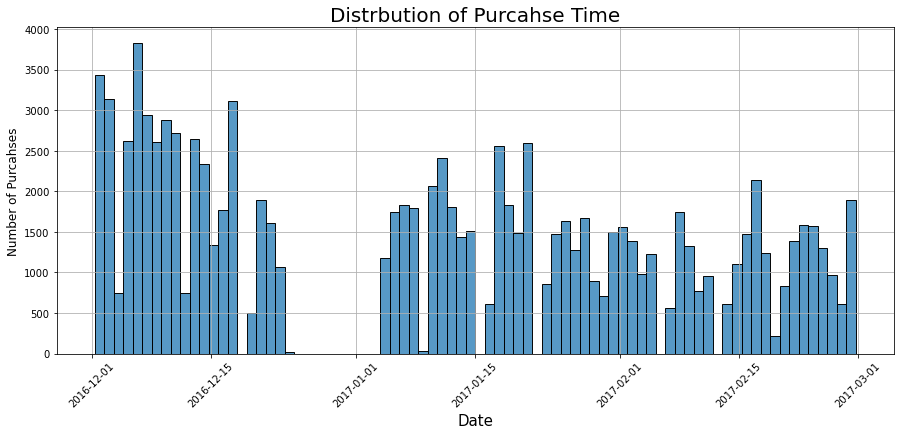

In [72]:
#plotting number of average member sales over entire period
fig, ax = plt.subplots(figsize=(15, 6))
sns.histplot(data= retail, x= 'purchase_date', bins= 80)
plt.xticks(rotation= 45)
plt.title('Distrbution of Purcahse Time', fontsize= 20)
plt.xlabel('Date', fontsize= 15)
plt.ylabel('Number of Purcahses', fontsize= 12)
plt.grid()
plt.show()

**For each customer, find the date of the last purchase.**

In [73]:
# Creating a column the day
retail['purchase_day'] = retail.purchase_date.dt.date
retail['week_day'] = retail['purchase_date'].dt.day_name()

In [74]:
# The data frame
retail.head(5)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday
1,538862,22195,0,2016-12-14 14:11:00,22389,1,Shop 2,2016-12-14,Wednesday
2,538855,21239,7,2016-12-14 13:50:00,22182,1,Shop 3,2016-12-14,Wednesday
3,543543,22271,0,2017-02-09 15:33:00,23522,1,Shop 28,2017-02-09,Thursday
4,543812,79321,0,2017-02-13 14:40:00,23151,1,Shop 28,2017-02-13,Monday


In [75]:
# To get the last date of each customer
retail.groupby('purchase_day')['week_day'].max().reset_index().head(10)

,purchase_day,week_day
0,2016-12-01,Thursday
1,2016-12-02,Friday
2,2016-12-03,Saturday
3,2016-12-05,Monday
4,2016-12-06,Tuesday
5,2016-12-07,Wednesday
6,2016-12-08,Thursday
7,2016-12-09,Friday
8,2016-12-10,Saturday
9,2016-12-12,Monday


In [76]:
retail.groupby(['purchase_day','quantity', 'week_day',])['purchase_id'].count().reset_index().sample(5)

,purchase_day,quantity,week_day,purchase_id
2041,2017-01-23,95,Monday,3
1124,2016-12-22,8,Thursday,1
1777,2017-01-17,14,Tuesday,13
2917,2017-02-15,25,Wednesday,1
2082,2017-01-24,99,Tuesday,2


**Using the purchase data split the customers into n categories.**

In [77]:
# Creating columns with week and month
retail['week'] = retail['purchase_date'].astype('datetime64[W]')
retail['month'] = retail['purchase_date'].dt.month_name()

In [78]:
# The vdata frame looks as follows
retail.head(10)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December
1,538862,22195,0,2016-12-14 14:11:00,22389,1,Shop 2,2016-12-14,Wednesday,2016-12-08,December
2,538855,21239,7,2016-12-14 13:50:00,22182,1,Shop 3,2016-12-14,Wednesday,2016-12-08,December
3,543543,22271,0,2017-02-09 15:33:00,23522,1,Shop 28,2017-02-09,Thursday,2017-02-09,February
4,543812,79321,0,2017-02-13 14:40:00,23151,1,Shop 28,2017-02-13,Monday,2017-02-09,February
5,538379,22965,0,2016-12-12 11:26:00,22805,1,Shop 20,2016-12-12,Monday,2016-12-08,December
6,540468,22189,0,2017-01-07 13:55:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January
7,541424,79321,1,2017-01-17 17:57:00,-9223372036854775808,0,Shop 0,2017-01-17,Tuesday,2017-01-12,January
8,538883,22891,0,2016-12-14 15:56:00,-9223372036854775808,0,Shop 0,2016-12-14,Wednesday,2016-12-08,December
9,539501,22372,0,2016-12-20 11:08:00,22764,1,Shop 1,2016-12-20,Tuesday,2016-12-15,December


In [79]:
retail.groupby(['week','shop_id'])['purchase_id'].count().reset_index().head()

,week,shop_id,purchase_id
0,2016-12-01,Shop 0,6366
1,2016-12-01,Shop 1,325
2,2016-12-01,Shop 10,498
3,2016-12-01,Shop 11,343
4,2016-12-01,Shop 12,279


In [80]:
# To get the last week of each customer
retail.groupby('purchase_day')['week'].max().reset_index().sample(10)

,purchase_day,week
0,2016-12-01,2016-12-01
16,2016-12-20,2016-12-15
26,2017-01-11,2017-01-05
42,2017-01-30,2017-01-26
5,2016-12-07,2016-12-01
9,2016-12-12,2016-12-08
33,2017-01-19,2017-01-19
41,2017-01-28,2017-01-26
22,2017-01-06,2017-01-05
57,2017-02-16,2017-02-16


In [81]:
# To get the last month of each customer
retail.groupby('purchase_day')['month'].max().reset_index().sample(10)

,purchase_day,month
20,2017-01-04,January
11,2016-12-14,December
32,2017-01-18,January
50,2017-02-08,February
30,2017-01-16,January
51,2017-02-09,February
55,2017-02-14,February
29,2017-01-14,January
3,2016-12-05,December
31,2017-01-17,January


**How many days the store works in a week**

In [82]:
# Check if store works on Monday
len(retail[retail.week_day == 'Monday'])

10279

In [83]:
# Check if store works on Tuesday
len(retail[retail.week_day == 'Tuesday'])

20824

In [84]:
# Check if store works on Wednesday
len(retail[retail.week_day == 'Wednesday'])

17984

In [85]:
# Check if store works on Thursday
len(retail[retail.week_day == 'Thursday'])

18542

In [86]:
# Check if store works on Friday
len(retail[retail.week_day == 'Friday'])

18758

In [87]:
# Check if store works on Saturday
len(retail[retail.week_day == 'Saturday'])

17915

In [88]:
# Check if store works on Sunday
len(retail[retail.week_day == 'Sunday'])

0

* The stops work 6 days in a week. It doesn't work on Sundays.
* The shops work for three months from December to February.
* The data frame is categorized by days, weeks, and months
* It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.
* The purchasing period was from 2016-12-01 to 2017-02-28.
* Top purchasing was done on 2016-12-06.

**Checking the character of the column quantity**

In [89]:
# Number of quantities in the data frame
retail['quantity'].count()

104302

In [90]:
# Checking the unique values of quantity
retail['quantity'].unique()

array([    11,      0,      7,      1,      5,      4,      3,      9,
           35,     23,      2,     71,     -2,    103,      6,     24,
          383,    -25,     18,     19,     95,    143,      8,     47,
           17,     20,     14,    -11,     12,     99,     39,     49,
          239,     25,     31,    -31,     29,    -61,     13,     15,
           28,    -13,     -3,     -8,   -101,    -10,   -940,     59,
          199,     27,     22,    119,    287,     37,     -9,     46,
           -5,    -81,     10,     -4,     -6,    215,    -41,     69,
          -16,    -26,   -724,     -7,   -100,     30,    479,   -193,
          -33,   2399,    -15,    191,     21,     63,    -24,    299,
          -19,   1295,    107,     79,     26,    140,    -17,    -14,
          359,    323,     32,   1007,     48,     64,    179,    251,
          -21,    -37,   1286,    -34,    599,    207,     33,    -36,
           52,   -145,     83,     43,    -54,    -65,     68,    503,
      

In [91]:
(retail['quantity'] < 0).count()

104302

In [92]:
# To count the amount of negative quantities
len(retail[retail.quantity < 0])
print('There are {} negative quantity values in the data frame.'.format(len(retail[retail.quantity < 0])))

There are 2076 negative quantity values in the data frame.


In [93]:
# To count the amount of negative quantities
retail[retail.quantity < 0].shape[0]
print('There are {} negative quantity values in the data frame.'.format(retail[retail.quantity < 0].shape[0]))

There are 2076 negative quantity values in the data frame.


In [94]:
print("The percentage of the negative quantities are {:.2%} of the whole dataset" 
      .format(retail[retail.quantity < 0].shape[0]/retail.shape[0]))


The percentage of the negative quantities are 1.99% of the whole dataset


In [95]:
# To count the amount of 0 quantities
retail[retail.quantity == 0].shape[0]
print('There are {} zero quantity values in the data frame.'.format(retail[retail.quantity == 0].shape[0]))

There are 32362 zero quantity values in the data frame.


In [96]:
print("The percentage of the zero quantities are {:.2%} of the whole dataset" 
      .format(retail[retail.quantity == 0].shape[0]/retail.shape[0]))


The percentage of the zero quantities are 31.03% of the whole dataset


In [97]:
# To count the amount of greater than 50 quantities
retail[retail.quantity > 50].shape[0]
print('There are {} quantities greater than 50 quantity values in the data frame.'
      .format(retail[retail.quantity > 50].shape[0]))

There are 2155 quantities greater than 50 quantity values in the data frame.


In [98]:
# To get the amount of share
print("The percentage of the quantities greater than 50 quantities are {:.2%} of the whole dataset" 
      .format(retail[retail.quantity > 50].shape[0]/retail.shape[0]))


The percentage of the quantities greater than 50 quantities are 2.07% of the whole dataset


In [99]:
# The distribution of quantities
fig = px.box(retail,x = 'quantity')
fig.show()


In [100]:
# To count the amount of greater than 50 quantities
retail[retail.quantity < -60000].shape[0]
print('There are {} quantities less than negative 60000 quantity values in the data frame.'
      .format(retail[retail.quantity > 50].shape[0]))

There are 2155 quantities less than negative 60000 quantity values in the data frame.


In [101]:
# To get the amount of share
print("The percentage of the quantities less than negative 60000 quantities are {:.2%} of the whole dataset" 
      .format(retail[retail.quantity < -60000].shape[0]/retail.shape[0]))


The percentage of the quantities less than negative 60000 quantities are 0.00% of the whole dataset


In [102]:
# The number of quantity values
retail[retail.quantity < - 70000]

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month
49411,C541433,23166,-74216,2017-01-18 10:17:00,18025,0,Shop 21,2017-01-18,Wednesday,2017-01-12,January


In [103]:
# The number of quantity values
retail[retail.quantity > 70000]

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month
69074,541431,23166,74214,2017-01-18 10:01:00,18025,0,Shop 15,2017-01-18,Wednesday,2017-01-12,January


In [104]:
# To drop the negative quantity values in the Data Frame
retail = retail[(retail.quantity >= 0) & (retail.quantity < 7000)]
retail.shape[0]

102225

In [105]:
#. To confirm that if negative quantities are dropped
retail[(retail.quantity < 0)].shape[0]

0

In [106]:
# The distribution of quantities
fig = px.box(retail,x = 'quantity')
fig.show()


**The number of shops** 

In [107]:
# To get the number of unique shops
retail.shop_id.nunique()

31

In [108]:
# The total shoping activities done
retail['purchase_id'].count()

102225

In [109]:
# To find the activities done by each shop as well as with the highest activities
shops_activity = retail.groupby('shop_id')['purchase_id'].count().reset_index().sort_values('purchase_id', ascending = False)
shops_activity.head(5)

,shop_id,purchase_id
0,Shop 0,37956
1,Shop 1,2645
7,Shop 15,2617
17,Shop 24,2535
15,Shop 22,2469


In [110]:
# To find shows with highest activities
shops_activity = retail.groupby('shop_id')['purchase_id'].count().reset_index().sort_values('purchase_id', ascending = False)
shops_activity.tail(5)

,shop_id,purchase_id
8,Shop 16,1862
4,Shop 12,1713
23,Shop 3,1677
14,Shop 21,1607
27,Shop 6,1604


In [111]:
# shops_activity.purchase_id[shops_activity.shop_id=='Shop 0']/shops_activity.purchase_id.sum()
average_shops_activity = shops_activity.purchase_id/shops_activity.purchase_id.sum()
round(average_shops_activity.head() * 100, 2)

0     37.13
1      2.59
7      2.56
17     2.48
15     2.42
Name: purchase_id, dtype: float64

In [112]:
# The average shoping activity 
average_shops_activity = round(shops_activity.purchase_id.mean(), 2)
print('The average shoping activity by the shops is:' ,average_shops_activity)

The average shoping activity by the shops is: 3297.58


**Finding the number of loyalty program customers and not customers** 

In [113]:
# Finding the unique numbers of loyalty program
retail['loyalty_program'].unique()

array([0, 1])

In [114]:
# To find member and not members of loyalty program
retail.loyalty_program.value_counts()

0    79252
1    22973
Name: loyalty_program, dtype: int64

There are 22,973 loyalty program members and 79,252 are not loyalty program members.

**Share of loyalty program members**

In [115]:
# To find loyalt program members
loyalty_members = len(retail[retail.loyalty_program == 1])
print("The number of loyalt program members is: {}".format(loyalty_members))

The number of loyalt program members is: 22973


In [116]:
# To find not loyalt program members
none_loyalty_members = len(retail[retail.loyalty_program == 0])
print("The number of non loyalt program members is: {}".format(none_loyalty_members))

The number of non loyalt program members is: 79252


In [117]:
share_loyalty_members = loyalty_members/retail.shape[0]
share_loyalty_members 

0.22472976277818538

In [118]:
print("The share of loyalty program members is: {:.2%}".format(share_loyalty_members))

The share of loyalty program members is: 22.47%


In [119]:
share_none_loyalty_members = none_loyalty_members/retail.shape[0]
share_none_loyalty_members 

0.7752702372218147

In [120]:
print("The share of none loyalty program members is: {:.2%}".format(share_none_loyalty_members))

The share of none loyalty program members is: 77.53%


**Conclusion**

* The total number of quanties are 104302.
* There are 2076 negative quantity values in the data frame. It is understood quantities can't be negative.The mistake may be type error or may be no double check up done. 
* The percentage of the negative quantities are 1.99% of the whole dataset. This result shows the negative values are very small and i decided to drop them to clear the data frame.
* There are 32362 zero quantity values in the data frame.
* The percentage of the zero quantities are 31.03% of the whole dataset.
* There are 2155 quantities greater than 50 quantity values in the data frame.
* The percentage of the quantities greater than 50 quantities are 2.07% of the whole dataset.
* There are 2155 quantities less than negative 60000 quantity values in the data frame.
* There are 31 unique shops.
* The first five shops with the highest shoping activities are shop 0, shop 1, shop 15, shop 24, and shop 22 and their activities are 37956, 2645, 2617, 2535 and 2469 respectively.
* Shops with the lowest activities are shop 16, shop 12, shop 3, shop 21 and shop 6 with activities of 1862, 1713, 1677, 1607 and 1604 respectively.
* The average shops activities is 3297.58.
* The number of loyalty program members is 22973, which is 22.47% of the program.
* The number of none loyalty program members is 79252, which is 77.53% of the program.
* The shops work 6 days in a week. It doesn't work on Sundays.
* The shops work for three months from December to February.
* The data frame is categorized by days, weeks, and months
It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.
* The purchasing period was from 2016-12-01 to 2017-02-28.
* Top purchasing was done on 2016-12-06.
* There are 2155 quantities less than negative 60000 quantity values in the data frame.


**Merging the retai and product datas**

In [121]:
# Merging the datas and finding the total items bought
sales = retail.merge(product,left_on = 'item_id', right_on = 'product_id')
sales['revenue']= sales['price_per_one'] * sales['quantity']
sales.head(10)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December,21873,0.42,4.62
1,541104,21873,0,2017-01-13 14:29:00,-9223372036854775808,0,Shop 0,2017-01-13,Friday,2017-01-12,January,21873,0.42,0.00
2,540418,21873,1,2017-01-07 11:04:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January,21873,0.42,0.42
3,541516,21873,2,2017-01-18 17:34:00,-9223372036854775808,0,Shop 0,2017-01-18,Wednesday,2017-01-12,January,21873,0.42,0.84
4,541566,21873,35,2017-01-19 11:50:00,23401,1,Shop 22,2017-01-19,Thursday,2017-01-19,January,21873,0.42,14.70
5,538843,21873,1,2016-12-14 13:18:00,21712,0,Shop 9,2016-12-14,Wednesday,2016-12-08,December,21873,0.42,0.42
6,540838,21873,11,2017-01-11 15:13:00,19541,0,Shop 4,2017-01-11,Wednesday,2017-01-05,January,21873,0.42,4.62
7,543592,21873,5,2017-02-10 11:57:00,22922,1,Shop 15,2017-02-10,Friday,2017-02-09,February,21873,0.42,2.10
8,544651,21873,71,2017-02-22 12:51:00,19373,0,Shop 17,2017-02-22,Wednesday,2017-02-16,February,21873,0.42,29.82
9,545062,21873,0,2017-02-27 14:07:00,18427,0,Shop 18,2017-02-27,Monday,2017-02-23,February,21873,0.42,0.00


In [122]:
# defining total amount by purchaseid
total_purchase = sales.groupby('purchase_id')['revenue'].sum().reset_index()
total_purchase.rename(columns = {'revenue':'purchase_total'}, inplace = True)
total_purchase.sample(5)

,purchase_id,purchase_total
495,537374,154.09
1038,538596,106.90
2561,542278,330.74
3865,545188,230.06
621,537648,195.47


In [123]:
# The distribution of total purchase
fig = px.violin(total_purchase, x = 'purchase_total')
fig.show()


In [124]:
# Purchases with total purchase zero
len(total_purchase[total_purchase.purchase_total == 0])

359

In [125]:
# Purchases with total purchase less than zero
len(total_purchase[total_purchase.purchase_total < 0])

0

In [126]:
# Purchases with total purchase greater than zero
len(total_purchase[total_purchase.purchase_total > 0])

3515

**Sales for customers who are in the loyality program as well as not in the loyalty program**

In [127]:
# The number of customers who are not in the loyalty program
non_loyalty_sales = sales.query('loyalty_program == 0')
non_loyalty_sales.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December,21873,0.42,4.62
1,541104,21873,0,2017-01-13 14:29:00,-9223372036854775808,0,Shop 0,2017-01-13,Friday,2017-01-12,January,21873,0.42,0.00
2,540418,21873,1,2017-01-07 11:04:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January,21873,0.42,0.42
3,541516,21873,2,2017-01-18 17:34:00,-9223372036854775808,0,Shop 0,2017-01-18,Wednesday,2017-01-12,January,21873,0.42,0.84
5,538843,21873,1,2016-12-14 13:18:00,21712,0,Shop 9,2016-12-14,Wednesday,2016-12-08,December,21873,0.42,0.42


In [128]:
# The number of customers who are in the loyalty program
loyalty_sales = sales.query('loyalty_program == 1')
loyalty_sales.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue
4,541566,21873,35,2017-01-19 11:50:00,23401,1,Shop 22,2017-01-19,Thursday,2017-01-19,January,21873,0.42,14.7
7,543592,21873,5,2017-02-10 11:57:00,22922,1,Shop 15,2017-02-10,Friday,2017-02-09,February,21873,0.42,2.1
11,542608,21873,0,2017-01-30 13:51:00,22449,1,Shop 21,2017-01-30,Monday,2017-01-26,January,21873,0.42,0.0
17,539252,21873,35,2016-12-16 14:17:00,23423,1,Shop 18,2016-12-16,Friday,2016-12-15,December,21873,0.42,14.7
20,544930,21873,0,2017-02-24 18:26:00,23151,1,Shop 3,2017-02-24,Friday,2017-02-23,February,21873,0.42,0.0


In [129]:
loyalty_sales_member = loyalty_sales.groupby('shop_id')['revenue'].sum().sort_values(ascending= False)
loyalty_sales_member 

shop_id
Shop 29    17561.22
Shop 5     15701.75
Shop 26    15205.01
Shop 3     12043.07
Shop 30    11492.55
Shop 8     11393.26
Shop 24    10510.66
Shop 23     9980.69
Shop 22     9558.22
Shop 13     9420.64
Shop 16     9236.69
Shop 2      8685.89
Shop 15     8624.95
Shop 12     8540.75
Shop 20     7878.73
Shop 9      7700.62
Shop 11     7666.07
Shop 14     7224.68
Shop 7      7170.50
Shop 25     7097.07
Shop 0      6851.52
Shop 19     6774.96
Shop 18     6619.19
Shop 17     6556.79
Shop 6      6203.01
Shop 4      6022.00
Shop 1      5933.67
Shop 21     5790.82
Shop 27     5451.36
Shop 10     5405.70
Shop 28     4720.32
Name: revenue, dtype: float64

In [130]:
fig = px.violin(loyalty_sales_member)
fig.update_traces(width=0.5)
fig.update_layout(title_text='Loyalty Members Sales')


fig.show()

In [131]:
# Average Purchase revenue
avg_loyalty_sales = loyalty_sales.groupby('customer_id')['revenue'].sum().mean()

print("The average purchase of loyalty program members:", round(avg_loyalty_sales, 2))

The average purchase of loyalty program members: 476.15


In [132]:
# Average orders per user
avg_order_loyalty = loyalty_sales.groupby('customer_id')['quantity'].sum().mean()
print("The average order of loyalty program members:", round(avg_order_loyalty, 2))

The average order of loyalty program members: 413.0


In [133]:
# The number of customers who are not in the loyalty program
non_loyalty_sales = sales.query('loyalty_program == 0')
non_loyalty_sales.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December,21873,0.42,4.62
1,541104,21873,0,2017-01-13 14:29:00,-9223372036854775808,0,Shop 0,2017-01-13,Friday,2017-01-12,January,21873,0.42,0.00
2,540418,21873,1,2017-01-07 11:04:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January,21873,0.42,0.42
3,541516,21873,2,2017-01-18 17:34:00,-9223372036854775808,0,Shop 0,2017-01-18,Wednesday,2017-01-12,January,21873,0.42,0.84
5,538843,21873,1,2016-12-14 13:18:00,21712,0,Shop 9,2016-12-14,Wednesday,2016-12-08,December,21873,0.42,0.42


In [134]:
non_loyalty_sales_member = non_loyalty_sales.groupby('shop_id')['revenue'].sum().sort_values(ascending= False)
non_loyalty_sales_member 

shop_id
Shop 0     99523.90
Shop 5     47755.51
Shop 4     34429.41
Shop 20    31953.32
Shop 13    30490.72
Shop 25    27815.84
Shop 28    26604.24
Shop 10    26389.62
Shop 15    26379.17
Shop 30    22769.58
Shop 18    22208.31
Shop 23    21785.20
Shop 6     20367.51
Shop 24    20060.61
Shop 1     19141.29
Shop 9     18912.97
Shop 7     18216.96
Shop 14    18112.67
Shop 17    17852.24
Shop 19    17784.47
Shop 26    17550.06
Shop 27    16833.66
Shop 2     16739.34
Shop 3     16641.44
Shop 11    16348.80
Shop 8     16213.63
Shop 22    15946.53
Shop 29    15037.11
Shop 12    13046.62
Shop 21    12967.42
Shop 16    11848.53
Name: revenue, dtype: float64

In [135]:
fig = px.violin(non_loyalty_sales_member)
fig.update_traces(width=0.5)
fig.update_layout(title_text='Not Loyalty Members Sales')


fig.show()

In [136]:
# Average Purchase revenue
avg_non_loyalty_sales = non_loyalty_sales.groupby('customer_id')['revenue'].sum().mean()

print("The average purchase of not loyalty program members:", round(avg_non_loyalty_sales, 2))

The average purchase of not loyalty program members: 660.45


In [137]:
# Average orders per user
avg_order_non_loyalty = non_loyalty_sales.groupby('customer_id')['quantity'].sum().mean()
print("The average order of not loyalty program members:", round(avg_order_non_loyalty, 2))

The average order of not loyalty program members: 567.78


In [138]:
# Get the highest revenue with respect to the shops
sales.groupby('shop_id')['revenue'].sum().sort_values(ascending= False).head(10)

shop_id
Shop 0     106375.42
Shop 5      63457.26
Shop 4      40451.41
Shop 13     39911.36
Shop 20     39832.05
Shop 15     35004.12
Shop 25     34912.91
Shop 30     34262.13
Shop 26     32755.07
Shop 29     32598.33
Name: revenue, dtype: float64

In [139]:
# Calculating average revenue
#creating a column to show percentage of sales for each purchase
sales['ave_revenue']= sales['revenue']/ (sales['revenue'].sum()) * 100
sales['ave_revenue'] 


0         0.000459
1         0.000000
2         0.000042
3         0.000083
4         0.001460
            ...   
102220    0.000000
102221    0.001321
102222    0.000194
102223    0.000000
102224    0.000209
Name: ave_revenue, Length: 102225, dtype: float64

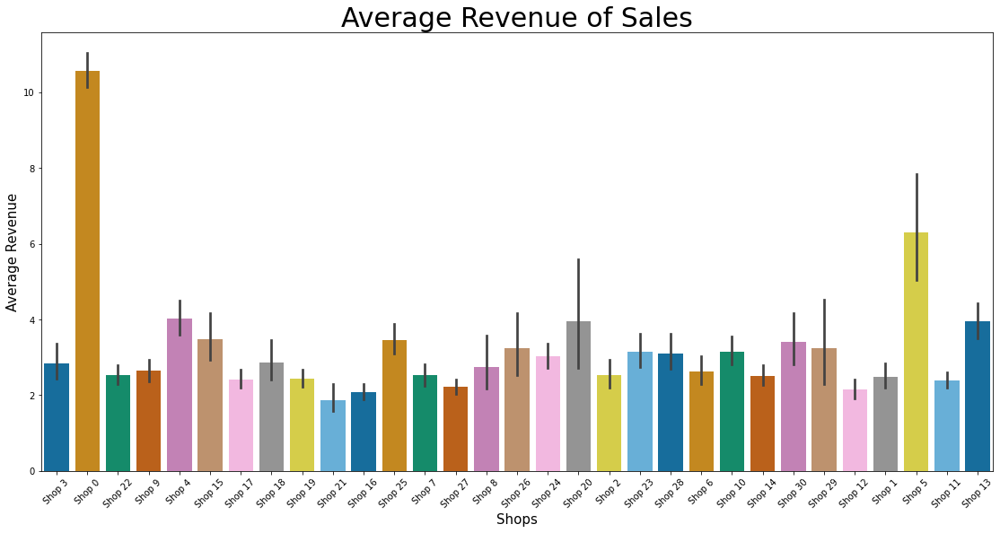

In [140]:
# Average revenue sales
plt.rcParams['figure.figsize'] = (19, 9)
sns.barplot(x = sales['shop_id'], y = sales['ave_revenue'], palette = 'colorblind',estimator=sum)
plt.xticks(rotation=45)
plt.title('Average Revenue of Sales', fontsize = 30)
plt.xlabel('Shops', fontsize = 15)
plt.ylabel('Average Revenue', fontsize = 15)
plt.show()


The first five top shops with the highest average revenue of sales are shop 0, shop 5, shop 4, shop 13 and shop 20 with 106375.42, 63457.26, 40451.41, 39911.36 and 39832.05 respectively. 

In [141]:
# Average revenue of loyalty program members
ave_loyalty_revenue = sales.query('loyalty_program == 1').groupby('shop_id')['ave_revenue'].sum().sort_values(ascending= False)
ave_loyalty_revenue

shop_id
Shop 29    1.744349
Shop 5     1.559649
Shop 26    1.510308
Shop 3     1.196234
Shop 30    1.141551
Shop 8     1.131688
Shop 24    1.044020
Shop 23    0.991378
Shop 22    0.949414
Shop 13    0.935749
Shop 16    0.917477
Shop 2     0.862766
Shop 15    0.856713
Shop 12    0.848349
Shop 20    0.782591
Shop 9     0.764900
Shop 11    0.761468
Shop 14    0.717625
Shop 7     0.712243
Shop 25    0.704949
Shop 0     0.680559
Shop 19    0.672954
Shop 18    0.657482
Shop 17    0.651283
Shop 6     0.616143
Shop 4     0.598163
Shop 1     0.589389
Shop 21    0.575200
Shop 27    0.541482
Shop 10    0.536946
Shop 28    0.468868
Name: ave_revenue, dtype: float64

In [142]:
# The violin graph of average loyalty program members revenue
fig = px.bar(ave_loyalty_revenue)
fig.update_traces(width = 0.5)
fig.update_xaxes(tickangle = 35)
fig.update_layout(title_text ='Average Revenue of Loyalty program Member')
fig.show()

The first five top shops with the highest average revenue for loyality members are shop 29, shop 5, shop 26, shop 3 and shop 30.

In [143]:
# Average revenue of non loyalty program members
ave_non_loyalty_revenue = sales.query('loyalty_program == 0').groupby('shop_id')['ave_revenue'].sum().sort_values(ascending= False)
ave_non_loyalty_revenue

shop_id
Shop 0     9.885671
Shop 5     4.743537
Shop 4     3.419860
Shop 20    3.173911
Shop 13    3.028632
Shop 25    2.762937
Shop 28    2.642589
Shop 10    2.621271
Shop 15    2.620233
Shop 30    2.261694
Shop 18    2.205943
Shop 23    2.163916
Shop 6     2.023097
Shop 24    1.992613
Shop 1     1.901297
Shop 9     1.878618
Shop 7     1.809484
Shop 14    1.799125
Shop 17    1.773256
Shop 19    1.766525
Shop 26    1.743241
Shop 27    1.672081
Shop 2     1.662712
Shop 3     1.652988
Shop 11    1.623920
Shop 8     1.610494
Shop 22    1.583963
Shop 29    1.493630
Shop 12    1.295916
Shop 21    1.288049
Shop 16    1.176910
Name: ave_revenue, dtype: float64

In [144]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102225 entries, 0 to 102224
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      102225 non-null  object        
 1   item_id          102225 non-null  object        
 2   quantity         102225 non-null  int64         
 3   purchase_date    102225 non-null  datetime64[ns]
 4   customer_id      102225 non-null  int64         
 5   loyalty_program  102225 non-null  int64         
 6   shop_id          102225 non-null  object        
 7   purchase_day     102225 non-null  object        
 8   week_day         102225 non-null  object        
 9   week             102225 non-null  datetime64[ns]
 10  month            102225 non-null  object        
 11  product_id       102225 non-null  object        
 12  price_per_one    102225 non-null  float64       
 13  revenue          102225 non-null  float64       
 14  ave_revenue      102

In [145]:
# The violin graph of average loyalty program members revenue
fig = px.bar(ave_non_loyalty_revenue)
fig.update_traces(width = 0.5)
fig.update_xaxes(tickangle = 35)
fig.update_layout(title_text ='Average Revenue of None Loyalty program Member')
fig.show()

The first five top shops with the highest average revenue for none loyality members are shop 0, shop 5, shop 4, shop 20 and shop 13.

**Average sales with respect to time**

In [146]:
daily_ave_revenue = sales.groupby('purchase_day').agg({'purchase_id':'nunique','revenue':'mean'}).reset_index()
daily_ave_revenue.head(10)

,purchase_day,purchase_id,revenue
0,2016-12-01,136,8.939588
1,2016-12-02,143,13.870969
2,2016-12-03,73,6.997596
3,2016-12-05,88,5.760822
4,2016-12-06,108,5.527509
5,2016-12-07,85,14.408402
6,2016-12-08,123,9.494704
7,2016-12-09,132,8.448896
8,2016-12-10,81,8.853099
9,2016-12-12,44,6.814808


In [147]:
fig = px.bar(daily_ave_revenue, x = 'purchase_day', y = 'revenue')

fig.add_hline(y=daily_ave_revenue.revenue.mean(),line_dash = "dash", line_color = "#c0c0c0")


fig.update_layout(
    title='Daily Average Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [148]:
daily_total_revenue = sales.groupby('purchase_day').agg({'purchase_id':'nunique','revenue':'sum'}).reset_index()
daily_total_revenue.head(10)

,purchase_day,purchase_id,revenue
0,2016-12-01,136,27140.59
1,2016-12-02,143,28060.97
2,2016-12-03,73,14988.85
3,2016-12-05,88,14995.42
4,2016-12-06,108,20860.82
5,2016-12-07,85,41842.00
6,2016-12-08,123,24040.59
7,2016-12-09,132,23572.42
8,2016-12-10,81,23513.83
9,2016-12-12,44,9424.88


In [149]:
fig = px.bar(daily_total_revenue, x = 'purchase_day', y = 'revenue')

fig.add_hline(y = daily_total_revenue.revenue.mean(), line_color = "#c0c0c0")


fig.update_layout(
    title='Daily Total Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    # font_color = "#281915"
)
fig.show() 

In [150]:
daily_ave_revenue = round(retail.groupby('purchase_day').agg({'purchase_id': 'nunique'}).mean(), 2)
daily_ave_revenue

purchase_id    56.97
dtype: float64

In [151]:
round(daily_ave_revenue.purchase_id.mean(), 2)

56.97

In [152]:
loyalty_ave_sales = round(sales.query('loyalty_program == 1').groupby('purchase_day')['revenue'].mean().reset_index(), 2)
loyalty_ave_sales.head(10)

,purchase_day,revenue
0,2016-12-01,8.79
1,2016-12-02,11.53
2,2016-12-03,6.15
3,2016-12-05,5.79
4,2016-12-06,7.38
5,2016-12-07,68.86
6,2016-12-08,9.64
7,2016-12-09,6.95
8,2016-12-10,9.10
9,2016-12-12,5.50


In [153]:
round(loyalty_ave_sales.mean(), 2)

revenue    12.53
dtype: float64

In [154]:
fig = px.bar(loyalty_ave_sales, x = 'purchase_day', y = 'revenue',)

fig.add_hline(y=loyalty_ave_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='Loyalty Program Members Purchases by a Day',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [155]:
non_loyalty_ave_sales = round(sales.query('loyalty_program == 0').groupby('purchase_day')['revenue'].mean().reset_index(), 2)
non_loyalty_ave_sales.head(10)

,purchase_day,revenue
0,2016-12-01,8.98
1,2016-12-02,15.58
2,2016-12-03,7.23
3,2016-12-05,5.75
4,2016-12-06,4.89
5,2016-12-07,6.06
6,2016-12-08,9.43
7,2016-12-09,8.89
8,2016-12-10,8.79
9,2016-12-12,7.67


In [156]:
round(non_loyalty_ave_sales.mean(), 2)

revenue    9.57
dtype: float64

In [157]:
fig = px.bar(non_loyalty_ave_sales, x = 'purchase_day', y = 'revenue',)

fig.add_hline(y=non_loyalty_ave_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='None Loyalty Program Members Purchases by a Day',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [158]:
weekly_ave_revenue = sales.groupby('week').agg({'purchase_id':'nunique','revenue':'mean'}).reset_index()
weekly_ave_revenue.head(5)

,week,purchase_id,revenue
0,2016-12-01,633,8.972737
1,2016-12-08,542,8.760772
2,2016-12-15,410,9.879015
3,2016-12-22,44,7.013795
4,2016-12-29,40,7.511121


In [159]:
fig = px.bar(weekly_ave_revenue, x = 'week', y = 'revenue')

fig.add_hline(y=weekly_ave_revenue.revenue.mean(),line_dash = "dash", line_color = "#c0c0c0")


fig.update_layout(
    title='Weekly Average Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [160]:
weekly_total_revenue = sales.groupby('week').agg({'purchase_id':'nunique','revenue':'sum'}).reset_index()
weekly_total_revenue.head(10)

,week,purchase_id,revenue
0,2016-12-01,633,147888.65
1,2016-12-08,542,119164.02
2,2016-12-15,410,97367.57
3,2016-12-22,44,8612.94
4,2016-12-29,40,8645.30
5,2017-01-05,314,111453.58
6,2017-01-12,253,79587.05
7,2017-01-19,261,82760.12
8,2017-01-26,317,68675.05
9,2017-02-02,274,67397.30


In [161]:
fig = px.bar(weekly_total_revenue, x = 'week', y = 'revenue')


fig.update_layout(
    title='Daily Total Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

Daily average purchase decreases with respect to time.

In [162]:
loyalty_weekly_avg_sales = sales.query('loyalty_program == 1').groupby('week')['revenue'].mean().reset_index()
loyalty_weekly_avg_sales.head(10)

,week,revenue
0,2016-12-01,13.826193
1,2016-12-08,8.019230
2,2016-12-15,13.392493
3,2016-12-22,7.269444
4,2016-12-29,12.286948
5,2017-01-05,14.073920
6,2017-01-12,8.571194
7,2017-01-19,7.639891
8,2017-01-26,11.310587
9,2017-02-02,19.949186


In [163]:
fig = px.bar(loyalty_weekly_avg_sales, x = 'week', y = 'revenue',)

fig.add_hline(y=loyalty_weekly_avg_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='Loyalty Program Members Purchases by a Week',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [164]:
non_loyalty_weekly_avg_sales = sales.query('loyalty_program == 0').groupby('week')['revenue'].mean().reset_index()
non_loyalty_weekly_avg_sales.head(10)

,week,revenue
0,2016-12-01,7.361455
1,2016-12-08,9.023457
2,2016-12-15,9.112572
3,2016-12-22,6.974944
4,2016-12-29,6.426631
5,2017-01-05,11.065667
6,2017-01-12,8.600865
7,2017-01-19,10.544654
8,2017-01-26,8.590130
9,2017-02-02,7.676987


In [165]:
fig = px.bar(non_loyalty_weekly_avg_sales, x = 'week', y = 'revenue',)

fig.add_hline(y=non_loyalty_weekly_avg_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='None Loyalty Program Members Purchases by a Week',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [166]:
weekly_ave_revenue = retail.groupby('week').agg({'purchase_id': 'nunique'}).mean()
weekly_ave_revenue

purchase_id    298.0
dtype: float64

In [167]:
weekly_ave_revenue.purchase_id.mean()

298.0

In [168]:
monthly_ave_revenue = sales.groupby('month').agg({'purchase_id':'nunique','revenue':'mean'}).reset_index()
monthly_ave_revenue = monthly_ave_revenue.reindex([0,2,1]).reset_index(drop=True)
monthly_ave_revenue.head(10)

,month,purchase_id,revenue
0,December,1629,9.061241
1,January,1119,9.785241
2,February,1126,11.130187


In [169]:
fig = px.bar(monthly_ave_revenue, x = 'month', y = 'revenue')

fig.add_hline(y=monthly_ave_revenue.revenue.mean(),line_dash = "dash", line_color = "#c0c0c0")


fig.update_layout(
    title='Monthly Average Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

Monthly average purchases increase with respect to time.

In [170]:
monthly_total_revenue = sales.groupby('month').agg({'purchase_id':'nunique','revenue':'sum'}).reset_index()
monthly_total_revenue = monthly_total_revenue.reindex([0,2,1]).reset_index(drop=True)
monthly_total_revenue.head(10)

,month,purchase_id,revenue
0,December,1629,373033.18
1,January,1119,333657.16
2,February,1126,300058.70


In [171]:
fig = px.bar(monthly_total_revenue, x = 'month', y = 'revenue')

fig.add_hline(y = monthly_total_revenue .revenue.mean(), line_color = "#c0c0c0")


fig.update_layout(
    title='Monthly Total Purchases',
    showlegend = True,
    plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    # font_color = "#281915"
)
fig.show() 

Monthly total purchase deceases with respect to time.

In [172]:
loyalty_monthly_avg_sales = sales.query('loyalty_program == 1').groupby('month')['revenue'].mean().reset_index()
loyalty_monthly_avg_sales = loyalty_monthly_avg_sales.reindex([0,2,1]).reset_index(drop=True)
loyalty_monthly_avg_sales.head(10)

,month,revenue
0,December,11.481895
1,January,9.924822
2,February,13.715872


In [173]:
fig = px.bar(loyalty_monthly_avg_sales, x = 'month', y = 'revenue',)

fig.add_hline(y=loyalty_monthly_avg_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='Loyalty Program Members Purchases by a Month',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [174]:
non_loyalty_monthly_avg_sales = sales.query('loyalty_program == 0').groupby('month')['revenue'].mean().reset_index()
non_loyalty_monthly_avg_sales = non_loyalty_monthly_avg_sales.reindex([0,2,1]).reset_index(drop=True)
non_loyalty_monthly_avg_sales.head(10)

,month,revenue
0,December,8.325807
1,January,9.752367
2,February,10.244210


In [175]:
fig = px.bar(non_loyalty_monthly_avg_sales, x = 'month', y = 'revenue',)

fig.add_hline(y=non_loyalty_monthly_avg_sales.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='None Loyalty Program Members Purchases by a Month',
    showlegend=True,
    #plot_bgcolor="#DDFFCC",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#281915"
)
fig.show() 

In [176]:
monthly_ave_revenue = retail.groupby('month').agg({'purchase_id': 'nunique'}).mean()
monthly_ave_revenue

purchase_id    1291.333333
dtype: float64

In [177]:
monthly_ave_revenue.purchase_id.mean()

1291.3333333333333

In [178]:
retail.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102225 entries, 0 to 105334
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      102225 non-null  object        
 1   item_id          102225 non-null  object        
 2   quantity         102225 non-null  int64         
 3   purchase_date    102225 non-null  datetime64[ns]
 4   customer_id      102225 non-null  int64         
 5   loyalty_program  102225 non-null  int64         
 6   shop_id          102225 non-null  object        
 7   purchase_day     102225 non-null  object        
 8   week_day         102225 non-null  object        
 9   week             102225 non-null  datetime64[ns]
 10  month            102225 non-null  object        
dtypes: datetime64[ns](2), int64(3), object(6)
memory usage: 9.4+ MB


In [179]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102225 entries, 0 to 102224
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      102225 non-null  object        
 1   item_id          102225 non-null  object        
 2   quantity         102225 non-null  int64         
 3   purchase_date    102225 non-null  datetime64[ns]
 4   customer_id      102225 non-null  int64         
 5   loyalty_program  102225 non-null  int64         
 6   shop_id          102225 non-null  object        
 7   purchase_day     102225 non-null  object        
 8   week_day         102225 non-null  object        
 9   week             102225 non-null  datetime64[ns]
 10  month            102225 non-null  object        
 11  product_id       102225 non-null  object        
 12  price_per_one    102225 non-null  float64       
 13  revenue          102225 non-null  float64       
 14  ave_revenue      102

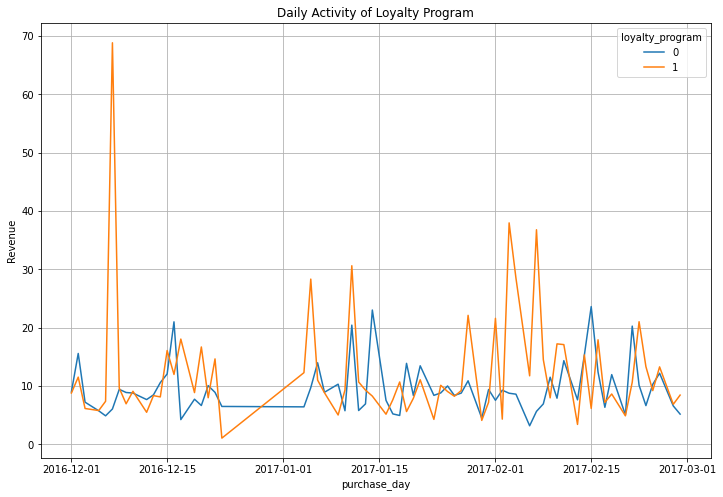

In [180]:
sales.pivot_table(index = 'purchase_day', columns = 'loyalty_program', values = 'revenue', aggfunc = 'mean').plot(grid = True, figsize = (12,8))
plt.title('Daily Activity of Loyalty Program')
plt.ylabel('Revenue')
plt.show()

* The revenue for both both members and none members of the loyalty program fluctuate every time from the start day upto the final day of purchase.
* At the beginning the revenue from the non members was maximam and through time decreases and starts to increase again around 2017-02-01 (at the beginning of February). Revenue for the loyalty members increases at the beginning of the month and decrease on other days.

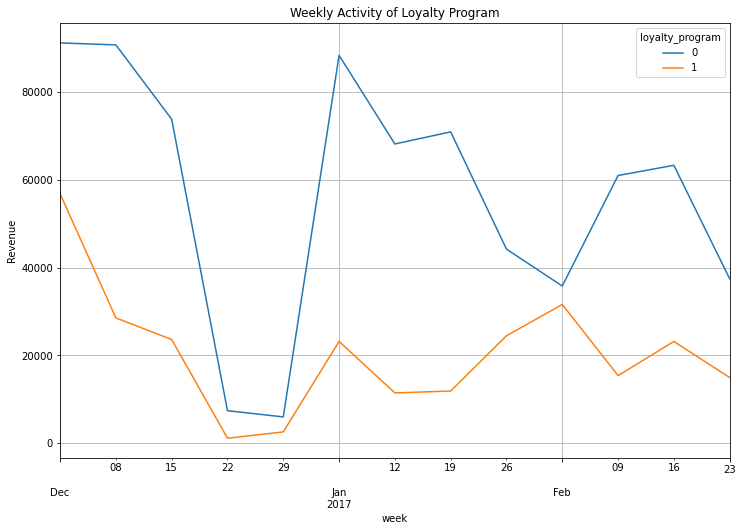

In [181]:
sales.pivot_table(index = 'week', columns = 'loyalty_program', values = 'revenue', aggfunc = 'sum').plot(grid = True, figsize = (12,8))
plt.title('Weekly Activity of Loyalty Program')
plt.ylabel('Revenue')
plt.show()

* Revenue starts decrease for both members and non members of loyalty program upto the end of December and starts to increase at the beginning week of January. 
* In the first week of the February month a special occassion appeared, the revenue for non members increased while for members decreased.

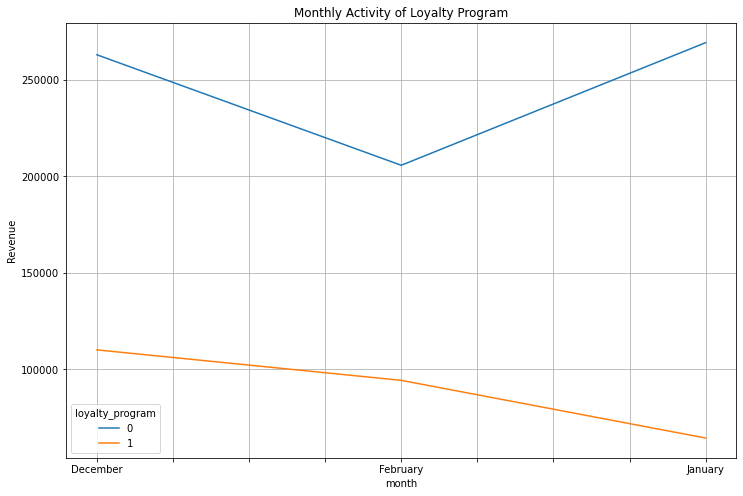

In [182]:
sales.pivot_table(index = 'month', columns = 'loyalty_program', values = 'revenue', aggfunc = 'sum')\
.plot(grid = True, figsize = (12,8))
plt.title('Monthly Activity of Loyalty Program')
plt.ylabel('Revenue')
plt.show()

**Week over week (wow) growth**

In [183]:
weekly_growth= sales.groupby('week').agg({'purchase_id':'nunique','revenue':'sum'}).reset_index()
weekly_growth

,week,purchase_id,revenue
0,2016-12-01,633,147888.65
1,2016-12-08,542,119164.02
2,2016-12-15,410,97367.57
3,2016-12-22,44,8612.94
4,2016-12-29,40,8645.30
5,2017-01-05,314,111453.58
6,2017-01-12,253,79587.05
7,2017-01-19,261,82760.12
8,2017-01-26,317,68675.05
9,2017-02-02,274,67397.30


In [184]:
# weekly_ growth = (sales(t) - sales(t-1))/sales(t-1) or (sales(t)/sales(t-1)) - 1
wow_growth = weekly_growth.sort_values('week')

wow_growth['wow']=0.0
for t in range(1,(len(weekly_growth))):
    wow_growth['wow'][t]= ((wow_growth['revenue'][t]/wow_growth['revenue'][t-1])-1)*100
wow_growth['previous_week']=0.0
for t in range(1,(len(wow_growth))):
    wow_growth['previous_week'][t]= ((wow_growth['purchase_id'][t]/wow_growth['purchase_id'][t-1])-1)*100
wow_growth

,week,purchase_id,revenue,wow,previous_week
0,2016-12-01,633,147888.65,0.000000,0.000000
1,2016-12-08,542,119164.02,-19.423147,-14.375987
2,2016-12-15,410,97367.57,-18.291134,-24.354244
3,2016-12-22,44,8612.94,-91.154201,-89.268293
4,2016-12-29,40,8645.30,0.375714,-9.090909
5,2017-01-05,314,111453.58,1189.181174,685.000000
6,2017-01-12,253,79587.05,-28.591751,-19.426752
7,2017-01-19,261,82760.12,3.986917,3.162055
8,2017-01-26,317,68675.05,-17.019151,21.455939
9,2017-02-02,274,67397.30,-1.860574,-13.564669


The growth of revenue week over week decreases for the first four week and starts to incease and become maximum on the first week of January. again started to deceases from the second of January. Revenue starts to incease in the beginning of the first week of February then decease at the last week of February. 

In [185]:
fig = px.line(wow_growth,x="week", y="wow",title='Week Over Week Growth (WoW) Revenue')
fig.add_hline(y=wow_growth['wow'].mean(),line_dash="dash", line_color="#c0c0c0")
fig.update_layout(
    showlegend=True,
    xaxis_title='Weeks',
    yaxis_title='Weekly Revenue',
    # plot_bgcolor="#FFFFFF",
    # xaxis_gridcolor="#cccfff",
    # yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79",
    
)
fig.show()

The growth of revenue week over week decreases for the first four week and starts to incease and become maximum on the first week of January. again started to deceases from the second of January. Revenue starts to incease in the beginning of the first week of February then decease at the last week of February.

In [186]:
fig = px.line(wow_growth,x="week", y="previous_week",title='Week Over Week Growth (WoW) Purchase')
#adding reference line
fig.add_hline(y=wow_growth['previous_week'].mean(),line_dash="dash", line_color="#c0c0c0")
fig.update_layout(
    showlegend=True,
    xaxis_title='Weeks',
    yaxis_title='Weekly Purchase',
    # plot_bgcolor="#FFFFFF",
    # xaxis_gridcolor="#cccfff",
    # yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79",
    
)
fig.show()

**Month over month (mom) growth**

In [187]:
monthly_growth= sales.groupby('month').agg({'purchase_id':'nunique','revenue':'sum'}).reset_index()
monthly_growth = monthly_growth.reindex([0,2,1]).reset_index(drop=True)
monthly_growth

,month,purchase_id,revenue
0,December,1629,373033.18
1,January,1119,333657.16
2,February,1126,300058.70


In [188]:
mom_growth = monthly_growth.sort_values('month')
mom_growth= mom_growth.reindex([0,2,1]).reset_index(drop=True)
mom_growth['mom'] = 0.0
for t in range(1,(len(monthly_growth))):
    mom_growth['mom'][t]= ((mom_growth['revenue'][t]/mom_growth['revenue'][t-1])-1)*100

mom_growth['previous_month']=0.0
for t in range(1,(len(mom_growth))):
    mom_growth['previous_month'][t]= ((mom_growth['purchase_id'][t]/mom_growth['purchase_id'][t-1])-1)*100
mom_growth = mom_growth.reindex([0,2,1]).reset_index(drop=True)
mom_growth

,month,purchase_id,revenue,mom,previous_month
0,December,1629,373033.18,0.000000,0.000000
1,January,1119,333657.16,11.197296,-0.621670
2,February,1126,300058.70,-19.562464,-30.877839


The revenue deceases every month from December to February.

In [189]:
fig = px.line(mom_growth,x="month", y="mom",title='Month Over Month Growth (MoM) Revenue')
fig.add_hline(y=mom_growth['mom'].mean(),line_dash="dash", line_color="#c0c0c0")
fig.update_layout(
    showlegend=True,
    xaxis_title='Months',
    yaxis_title='Monthly Revenue',
     plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79",
    
)
fig.show()

The revenue increases from December to January then decrease from January to February.

In [190]:
fig = px.line(mom_growth,x="month", y="previous_month",title='Month Over Month Growth (MoM) Purchase')
#adding reference line
fig.add_hline(y=mom_growth['previous_month'].mean(),line_dash="dash", line_color="#c0c0c0")
fig.update_layout(
    showlegend=True,
    xaxis_title='Months',
    yaxis_title='Monthly Purchase',
     plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79",
    
)
fig.show()

The Purchase was constant from December to January but sharply decreased from January to February.

In [191]:
# Store data in the first activity date
first_activity_date = sales.groupby(['customer_id'])['purchase_date'].min()
first_activity_date.name = 'first_activity_date'
sales = sales.join(first_activity_date, on = 'customer_id')
print(sales.head(10))

  purchase_id item_id  quantity       purchase_date          customer_id  \
0      538280   21873        11 2016-12-10 12:50:00                18427   
1      541104   21873         0 2017-01-13 14:29:00 -9223372036854775808   
2      540418   21873         1 2017-01-07 11:04:00 -9223372036854775808   
3      541516   21873         2 2017-01-18 17:34:00 -9223372036854775808   
4      541566   21873        35 2017-01-19 11:50:00                23401   
5      538843   21873         1 2016-12-14 13:18:00                21712   
6      540838   21873        11 2017-01-11 15:13:00                19541   
7      543592   21873         5 2017-02-10 11:57:00                22922   
8      544651   21873        71 2017-02-22 12:51:00                19373   
9      545062   21873         0 2017-02-27 14:07:00                18427   

   loyalty_program  shop_id purchase_day   week_day       week     month  \
0                0   Shop 3   2016-12-10   Saturday 2016-12-08  December   
1          

In [192]:
sales['first_activity_week'] = sales['first_activity_date'].astype('datetime64[W]')
sales['activity_week'] = sales['purchase_date'].astype("datetime64[W]")
sales.head(10)

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue,ave_revenue,first_activity_date,first_activity_week,activity_week
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December,21873,0.42,4.62,0.000459,2016-12-01 12:48:00,2016-12-01,2016-12-08
1,541104,21873,0,2017-01-13 14:29:00,-9223372036854775808,0,Shop 0,2017-01-13,Friday,2017-01-12,January,21873,0.42,0.00,0.000000,2016-12-01 11:52:00,2016-12-01,2017-01-12
2,540418,21873,1,2017-01-07 11:04:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January,21873,0.42,0.42,0.000042,2016-12-01 11:52:00,2016-12-01,2017-01-05
3,541516,21873,2,2017-01-18 17:34:00,-9223372036854775808,0,Shop 0,2017-01-18,Wednesday,2017-01-12,January,21873,0.42,0.84,0.000083,2016-12-01 11:52:00,2016-12-01,2017-01-12
4,541566,21873,35,2017-01-19 11:50:00,23401,1,Shop 22,2017-01-19,Thursday,2017-01-19,January,21873,0.42,14.70,0.001460,2016-12-08 12:41:00,2016-12-08,2017-01-19
5,538843,21873,1,2016-12-14 13:18:00,21712,0,Shop 9,2016-12-14,Wednesday,2016-12-08,December,21873,0.42,0.42,0.000042,2016-12-05 10:36:00,2016-12-01,2016-12-08
6,540838,21873,11,2017-01-11 15:13:00,19541,0,Shop 4,2017-01-11,Wednesday,2017-01-05,January,21873,0.42,4.62,0.000459,2017-01-11 15:13:00,2017-01-05,2017-01-05
7,543592,21873,5,2017-02-10 11:57:00,22922,1,Shop 15,2017-02-10,Friday,2017-02-09,February,21873,0.42,2.10,0.000209,2016-12-05 10:03:00,2016-12-01,2017-02-09
8,544651,21873,71,2017-02-22 12:51:00,19373,0,Shop 17,2017-02-22,Wednesday,2017-02-16,February,21873,0.42,29.82,0.002962,2016-12-01 12:12:00,2016-12-01,2017-02-16
9,545062,21873,0,2017-02-27 14:07:00,18427,0,Shop 18,2017-02-27,Monday,2017-02-23,February,21873,0.42,0.00,0.000000,2016-12-01 12:48:00,2016-12-01,2017-02-23


In [193]:
sales['activity_week'].head(10)

0   2016-12-08
1   2017-01-12
2   2017-01-05
3   2017-01-12
4   2017-01-19
5   2016-12-08
6   2017-01-05
7   2017-02-09
8   2017-02-16
9   2017-02-23
Name: activity_week, dtype: datetime64[ns]

In [194]:
# Calculate user lifetime within the cohort for each row of the DataFrame.
sales['cohort_lifetime'] = (sales['activity_week'] - sales['first_activity_week'] ) 
sales['cohort_lifetime'] = (sales['cohort_lifetime'] / np.timedelta64(1, 'W')).round().astype(int)
sales.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,revenue,ave_revenue,first_activity_date,first_activity_week,activity_week,cohort_lifetime
0,538280,21873,11,2016-12-10 12:50:00,18427,0,Shop 3,2016-12-10,Saturday,2016-12-08,December,21873,0.42,4.62,0.000459,2016-12-01 12:48:00,2016-12-01,2016-12-08,1
1,541104,21873,0,2017-01-13 14:29:00,-9223372036854775808,0,Shop 0,2017-01-13,Friday,2017-01-12,January,21873,0.42,0.00,0.000000,2016-12-01 11:52:00,2016-12-01,2017-01-12,6
2,540418,21873,1,2017-01-07 11:04:00,-9223372036854775808,0,Shop 0,2017-01-07,Saturday,2017-01-05,January,21873,0.42,0.42,0.000042,2016-12-01 11:52:00,2016-12-01,2017-01-05,5
3,541516,21873,2,2017-01-18 17:34:00,-9223372036854775808,0,Shop 0,2017-01-18,Wednesday,2017-01-12,January,21873,0.42,0.84,0.000083,2016-12-01 11:52:00,2016-12-01,2017-01-12,6
4,541566,21873,35,2017-01-19 11:50:00,23401,1,Shop 22,2017-01-19,Thursday,2017-01-19,January,21873,0.42,14.70,0.001460,2016-12-08 12:41:00,2016-12-08,2017-01-19,6


In [195]:
# Group the data by cohort and lifetime and find the number of active users at a certain lifetime week for each cohor
cohorts = sales.groupby(['first_activity_week','cohort_lifetime']).agg({'customer_id':'nunique'}).reset_index()
cohorts.head(10)

,first_activity_week,cohort_lifetime,customer_id
0,2016-12-01,0,424
1,2016-12-01,1,87
2,2016-12-01,2,79
3,2016-12-01,3,10
4,2016-12-01,4,14
5,2016-12-01,5,80
6,2016-12-01,6,63
7,2016-12-01,7,49
8,2016-12-01,8,59
9,2016-12-01,9,57


In [196]:
# To find the initial number of users in the cohort by looking at the 0th week.
initial_customer_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_week','customer_id']]
initial_customer_count.head(10)

,first_activity_week,customer_id
0,2016-12-01,424
13,2016-12-08,291
25,2016-12-15,158
36,2016-12-22,13
40,2016-12-29,14
44,2017-01-05,121
52,2017-01-12,92
59,2017-01-19,103
65,2017-01-26,116
70,2017-02-02,91


In [197]:
# To rename the uid column as cohort_users
initial_customer_count = initial_customer_count.rename(columns={'customer_id':'cohort_users'})
initial_customer_count.head(10)

,first_activity_week,cohort_users
0,2016-12-01,424
13,2016-12-08,291
25,2016-12-15,158
36,2016-12-22,13
40,2016-12-29,14
44,2017-01-05,121
52,2017-01-12,92
59,2017-01-19,103
65,2017-01-26,116
70,2017-02-02,91


In [198]:
# Join the data on cohorts with the initial number of users in the cohort
cohorts = cohorts.merge(initial_customer_count,on=['first_activity_week'])
cohorts.head(10)

,first_activity_week,cohort_lifetime,customer_id,cohort_users
0,2016-12-01,0,424,424
1,2016-12-01,1,87,424
2,2016-12-01,2,79,424
3,2016-12-01,3,10,424
4,2016-12-01,4,14,424
5,2016-12-01,5,80,424
6,2016-12-01,6,63,424
7,2016-12-01,7,49,424
8,2016-12-01,8,59,424
9,2016-12-01,9,57,424


In [199]:
# To calculate the retention rate, divide the number of active users in each week by the initial number of u
cohorts['retention'] = cohorts['customer_id']/cohorts['cohort_users']
cohorts['retention']

0     1.000000
1     0.205189
2     0.186321
3     0.023585
4     0.033019
        ...   
75    0.044118
76    0.029412
77    1.000000
78    0.043011
79    1.000000
Name: retention, Length: 80, dtype: float64

In [200]:
# To compile a pivot table
retention_pivot = cohorts.pivot_table(
            index='first_activity_week',
            columns='cohort_lifetime',
            values='retention',
            aggfunc='sum')
retention_pivot

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11,12
first_activity_week,,,,,,,,,,,,,
2016-12-01,1.0,0.205189,0.186321,0.023585,0.033019,0.188679,0.148585,0.115566,0.139151,0.134434,0.139151,0.125000,0.120283
2016-12-08,1.0,0.137457,0.017182,0.017182,0.109966,0.096220,0.109966,0.130584,0.089347,0.092784,0.130584,0.051546,NaN
2016-12-15,1.0,0.006329,0.012658,0.063291,0.082278,0.088608,0.113924,0.101266,0.069620,0.082278,0.075949,NaN,NaN
2016-12-22,1.0,NaN,NaN,0.076923,NaN,0.076923,NaN,NaN,NaN,0.076923,NaN,NaN,NaN
2016-12-29,1.0,0.071429,NaN,NaN,NaN,0.142857,NaN,0.142857,NaN,NaN,NaN,NaN,NaN
2017-01-05,1.0,0.033058,0.049587,0.066116,0.082645,0.082645,0.074380,0.066116,NaN,NaN,NaN,NaN,NaN
2017-01-12,1.0,0.043478,0.097826,0.054348,0.043478,0.097826,0.108696,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-19,1.0,0.009709,0.048544,0.048544,0.038835,0.048544,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-26,1.0,0.025862,0.043103,0.034483,0.060345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [201]:
print(retention_pivot.head(10))

cohort_lifetime       0         1         2         3         4         5   \
first_activity_week                                                          
2016-12-01           1.0  0.205189  0.186321  0.023585  0.033019  0.188679   
2016-12-08           1.0  0.137457  0.017182  0.017182  0.109966  0.096220   
2016-12-15           1.0  0.006329  0.012658  0.063291  0.082278  0.088608   
2016-12-22           1.0       NaN       NaN  0.076923       NaN  0.076923   
2016-12-29           1.0  0.071429       NaN       NaN       NaN  0.142857   
2017-01-05           1.0  0.033058  0.049587  0.066116  0.082645  0.082645   
2017-01-12           1.0  0.043478  0.097826  0.054348  0.043478  0.097826   
2017-01-19           1.0  0.009709  0.048544  0.048544  0.038835  0.048544   
2017-01-26           1.0  0.025862  0.043103  0.034483  0.060345       NaN   
2017-02-02           1.0  0.065934  0.043956  0.054945       NaN       NaN   

cohort_lifetime            6         7         8         9     

**Conclusion**


* It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.
* The purchase time is distributed from 2016-12-01 to 2017-02-28. But around Christmas there was almost no purchasing. The rate of purchase started after Christmas but it decrease with respect to time. It is getting slowers and slower.
* The stops work 6 days in a week. It doesn't work on Sundays.
* The shops work for three months from December to February.
* The data frame is categorized by days, weeks, and months
* It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.
* The purchasing period was from 2016-12-01 to 2017-02-28.
* Top purchasing was done on 2016-12-06.
* There are 2076 negative quantity values in the data frame.
* The percentage of the negative quantities are 1.99% of the whole datasetThere are 32362 zero quantity values in the data frame.
* The percentage of the zero quantities are 31.03% of the whole dataset
* There are 2155 quantities greater than 50 quantity values in the data frame.
* The percentage of the quantities greater than 50 quantities are 2.07% of the whole dataset
* There are 2155 quantities less than negative 60000 quantity values in the data frame.
* There are 22,973 loyalty program members and 79,252 are not loyalty program members.
* The share of loyalty program members is: 22.47%
* The share of none loyalty program members is: 77.53%

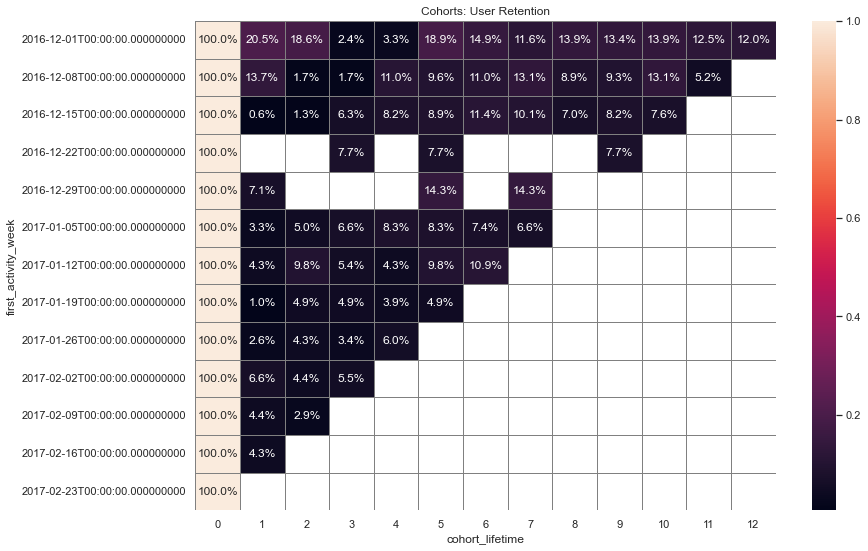

In [202]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray')
plt.show()

In the image, we can see that there is a sharp drop-off in the second week (indexed as 1) already, on average around 86.3% of customers do not make any purchase in the second week. The first cohort (2016–12-01) seems to be an exception and performs surprisingly well as compared to the other ones. After three months the first purchase, there is a 12% retention. This might be a cohort of dedicated customers, who first joined the platform based on some already-existing connections with the retailer. However, from data alone, that is very hard to accurately explain.

Customers since the cohort of 2017-01-05 are even less likely to return, which is something that should grap attention.



**Hypothesis**

* H0: The revenue for the members of the loyalty program and the non members are the same.
* H1: The revenue for the members of the loyalty program and the non members are not the same.

In [203]:
sample1 = sales[sales['loyalty_program'] == 1]
sample2 = sales[sales['loyalty_program'] == 0]



alpha = 0.05 

results = stats.ttest_ind(sample1['revenue'], sample2['revenue'])

print('p-value:', results.pvalue)

if results.pvalue < alpha: 
    print("We reject the null hypothesis")
else:
    print("We can't reject the null hypothesis")

p-value: 1.1735824085129898e-09
We reject the null hypothesis


Based on the result, it could be said the revenue for the members of the loyalty program and the non members are not the same.

In [204]:
sales.customer_id[sales.loyalty_program ==1].nunique()

565

In [205]:
loyal=sales.groupby('loyalty_program')['customer_id'].nunique().reset_index()
loyal['members']=['no-loyalty program',' loyalty program']
loyal

,loyalty_program,customer_id,members
0,0,1117,no-loyalty program
1,1,565,loyalty program


In [206]:
fig = px.pie(loyal, values='customer_id', names='members', color = 'loyalty_program')
fig.show()

In [207]:
# Get the relationship between revenue and shops
shops_data = sales.groupby(['week','shop_id'])\
.agg({'customer_id':'nunique','purchase_id':'nunique','revenue':'sum'}).reset_index()
shops_data.head()

,week,shop_id,customer_id,purchase_id,revenue
0,2016-12-01,Shop 0,18,82,22651.55
1,2016-12-01,Shop 1,17,18,2310.94
2,2016-12-01,Shop 10,24,27,7606.19
3,2016-12-01,Shop 11,18,19,2466.22
4,2016-12-01,Shop 12,14,14,1712.79


In [208]:
fig = px.line(shops_data,x="week", y="purchase_id",title=' Weekly Purchases with respect to shops', color ='shop_id', 
             color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.update_layout(
    showlegend=True,
    plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10)
)
fig.show()

Almost all the shops start their purchase with customers between 0 and 20 but shop one starts with 80 custoners.

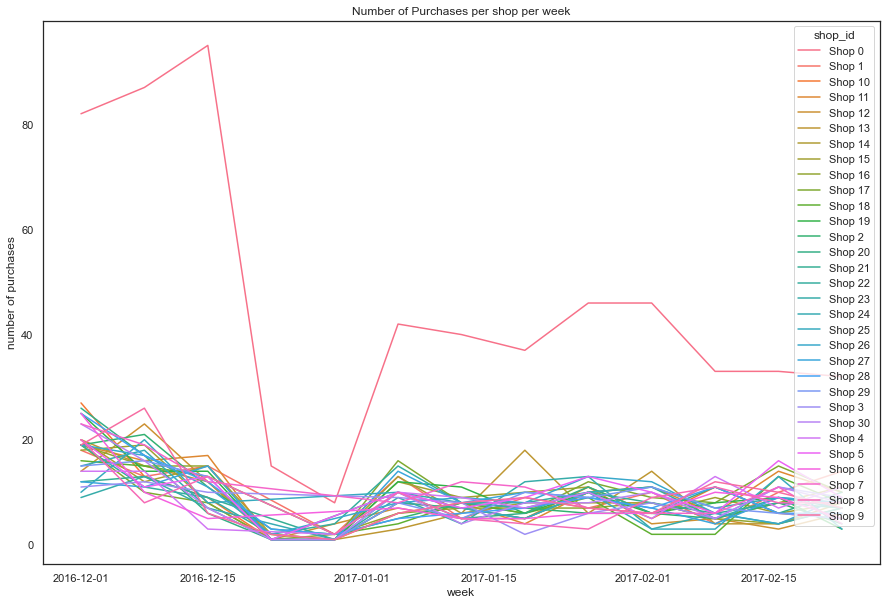

In [209]:
plt.figure(figsize=(15, 10))
sns.lineplot(data=shops_data, y='purchase_id', x='week', hue='shop_id')
plt.title('Number of Purchases per shop per week')
plt.ylabel('number of purchases')

plt.show()


In [210]:
fig = px.bar(shops_data, x='shop_id', y='purchase_id',
    color = 'shop_id', color_discrete_sequence=px.colors.qualitative.Alphabet,
    
)

fig.add_hline(y=shops_data.purchase_id.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='Purchases per Shop',
    showlegend=True,
    plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79"
)
fig.show() 

The shop with the highest purchase is shop 0. The others almost look they are at the same level.

In [211]:
fig = px.bar(shops_data, x='shop_id', y='revenue',
    color = 'shop_id', color_discrete_sequence=px.colors.qualitative.Alphabet,
    
)

fig.add_hline(y=shops_data.revenue.mean(),line_dash="dash", line_color="#c0c0c0")


fig.update_layout(
    title='Revenue per Shops',
    showlegend=True,
     plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79"
)
fig.show() 

The highest revenue is obtained from shop 0, shop 5 and shop 13 and shop 20.

In [212]:
week_shop = sales.groupby(['shop_id','week' ]).agg({'revenue':'sum' , 'customer_id':'nunique' ,\
                                        'purchase_id':'nunique'}).reset_index()
week_shop.sample(10)

,shop_id,week,revenue,customer_id,purchase_id
72,Shop 13,2017-02-02,2960.67,14,14
310,Shop 30,2017-02-02,2296.09,10,10
250,Shop 26,2017-02-23,1252.23,9,9
25,Shop 10,2016-12-01,7606.19,24,27
309,Shop 30,2017-01-26,3676.48,8,8
255,Shop 27,2016-12-29,493.34,1,1
340,Shop 6,2016-12-15,1363.01,5,5
246,Shop 26,2017-01-26,5663.50,13,13
360,Shop 8,2016-12-01,3313.49,19,20
37,Shop 10,2017-02-23,1353.45,5,5


In [213]:
sales.groupby('revenue').max().reset_index().reindex([5, 0, 4, 2, 3, 1])


,revenue,purchase_id,item_id,quantity,purchase_date,customer_id,loyalty_program,shop_id,purchase_day,week_day,week,month,product_id,price_per_one,ave_revenue,first_activity_date,first_activity_week,activity_week,cohort_lifetime
5,0.10,536544,20668,1,2016-12-01 14:32:00,-9223372036854775807,0,Shop 0,2016-12-01,Thursday,2016-12-01,December,20668,0.10,0.000010,2016-12-01 11:52:00,2016-12-01,2016-12-01,0
0,0.00,545218,m,5567,2017-02-28 17:01:00,23962,1,Shop 9,2017-02-28,Wednesday,2017-02-23,January,m,145.00,0.000000,2017-02-28 17:01:00,2017-02-23,2017-02-23,12
4,0.09,543461,84347,3,2017-02-08 13:35:00,22406,1,Shop 30,2017-02-08,Wednesday,2017-02-02,February,84347,0.03,0.000009,2016-12-10 13:48:00,2016-12-08,2017-02-02,9
2,0.06,544766,84347,2,2017-02-23 11:09:00,23576,1,Shop 29,2017-02-23,Wednesday,2017-02-23,January,84347,0.06,0.000006,2016-12-01 12:31:00,2016-12-01,2017-02-23,12
3,0.07,538524,17038,1,2016-12-13 09:35:00,-9223372036854775807,0,Shop 0,2016-12-13,Tuesday,2016-12-08,December,17038,0.07,0.000007,2016-12-01 11:52:00,2016-12-01,2016-12-08,1
1,0.03,544207,84347,1,2017-02-17 10:34:00,18853,0,Shop 22,2017-02-17,Tuesday,2017-02-16,January,84347,0.03,0.000003,2016-12-05 16:24:00,2016-12-01,2017-02-16,11


In [214]:
week_shop.groupby('week')['revenue'].sum().reset_index().sort_values(['revenue'], ascending=False) 


,week,revenue
0,2016-12-01,147888.65
1,2016-12-08,119164.02
5,2017-01-05,111453.58
2,2016-12-15,97367.57
11,2017-02-16,86426.36
7,2017-01-19,82760.12
6,2017-01-12,79587.05
10,2017-02-09,76356.09
8,2017-01-26,68675.05
9,2017-02-02,67397.30


In [215]:
(week_shop.nunique())

shop_id         31
week            13
revenue        385
customer_id     26
purchase_id     34
dtype: int64

In [216]:
lmax=[]
for s in week_shop.shop_id.unique():
    a =week_shop[(week_shop.shop_id==s)\
                     &(week_shop.revenue==week_shop.revenue[week_shop.shop_id==s].max())].index.max()
    lmax.append(a)
for d in week_shop.index:
    if d not in lmax:
        week_shop = week_shop.drop(d)

In [217]:
week_shop.groupby('week')['revenue'].sum().reset_index().sort_values(['revenue'], ascending=False) 


,week,revenue
0,2016-12-01,69123.01
3,2017-01-05,41627.66
8,2017-02-16,33730.73
4,2017-01-12,24580.21
6,2017-02-02,24227.70
2,2016-12-15,17587.45
7,2017-02-09,17278.66
1,2016-12-08,11851.24
5,2017-01-19,6935.52


In [218]:
week_shop= week_shop.reset_index(drop=True)
week_shop= week_shop.reindex([0,1,12,23,25,26,27,28,29,30,2,3,4,5,6,7,8,9,10,11,13,14,15,16,17,18,19,20,21,22,24])    
week_shop= week_shop.reset_index(drop=True)

week_shop.head()


,shop_id,week,revenue,customer_id,purchase_id
0,Shop 0,2016-12-01,22651.55,18,82
1,Shop 1,2017-02-16,5950.35,10,10
2,Shop 2,2016-12-01,6126.47,19,19
3,Shop 3,2017-01-05,5390.98,9,9
4,Shop 4,2017-02-16,11415.94,7,7


In [219]:
week_shop.groupby('week')['revenue'].sum().reset_index().sort_values(['revenue'], ascending=False) 


,week,revenue
0,2016-12-01,69123.01
3,2017-01-05,41627.66
8,2017-02-16,33730.73
4,2017-01-12,24580.21
6,2017-02-02,24227.70
2,2016-12-15,17587.45
7,2017-02-09,17278.66
1,2016-12-08,11851.24
5,2017-01-19,6935.52


In [220]:
fig = px.bar(week_shop, x='week', y='shop_id',color = 'shop_id',
             color_discrete_sequence=px.colors.qualitative.Alphabet, text="shop_id", 
             

    )

fig.update_layout(
    title='Selling in the WeekDays',
    showlegend=False,
     plot_bgcolor="#FFFFFF",
    xaxis_gridcolor="#cccfff",
    yaxis_gridcolor="#cccfff",
    margin=dict(t=50,l=10,b=10,r=10),
    font_color = "#1f4f79"
)
fig.show() 


In [221]:
avg_purchase = sales.groupby(
    ['shop_id']
).agg({'revenue': 'sum', 'purchase_id': 'nunique'}).reset_index()
avg_purchase['avg_purchase'] = (
    avg_purchase['revenue']
    / avg_purchase['purchase_id'])
avg_purchase['avg_purchase']=round(avg_purchase['avg_purchase'],2)
fig = px.bar(avg_purchase.sort_values(by='avg_purchase',ascending=False), x="shop_id", y="avg_purchase")
fig.update_layout(title='Average purchase size by shop',
                   xaxis_title='shop',
                   yaxis_title='Average purchase size')
fig.show();

The top average purchase size are obtained from shop 5, shop 4, shop 25, shop 23 and shop 13.  

In [222]:
# sales['purchase_day'] = sales['purchase_date'].astype('datetime64[D]')
num_purchase = sales.groupby(
    ['shop_id']
).agg({'purchase_id': 'count', 'purchase_day': 'nunique'}).reset_index()
num_purchase['avg_num_purchase'] = (
    num_purchase['purchase_id']
    / num_purchase['purchase_day'])
num_purchase['avg_num_purchase']=round(num_purchase['avg_num_purchase'],2)
fig = px.bar(num_purchase.sort_values(by='avg_num_purchase',ascending=False), x="shop_id", y="avg_num_purchase")
fig.update_layout(title='Daily Average number of purchase per shop',
                   xaxis_title='shop',
                   yaxis_title='Average number of purchase')
fig.show();

In [223]:
sales['purchase_day'] = sales['purchase_date'].astype('datetime64[D]')
num_purchase = sales.groupby(
    ['shop_id']
).agg({'purchase_id': 'count', 'week': 'nunique'}).reset_index()
num_purchase['avg_num_purchase'] = (
    num_purchase['purchase_id']
    / num_purchase['week'])
num_purchase['avg_num_purchase']=round(num_purchase['avg_num_purchase'],2)
fig = px.bar(num_purchase.sort_values(by='avg_num_purchase',ascending=False), x="shop_id", y="avg_num_purchase")
fig.update_layout(title='Weekly Average number of purchase per shop',
                   xaxis_title='shop',
                   yaxis_title='Average number of purchase')
fig.show();

In [224]:
total_purchase = sales.groupby(
    ['shop_id']
).agg({'revenue': 'sum', 'purchase_day': 'nunique'}).reset_index()
total_purchase['avg_purchase'] = (
    total_purchase['revenue']
    / total_purchase['purchase_day'])
total_purchase['avg_purchase']=round(total_purchase['avg_purchase'],2)
fig = px.bar(total_purchase.sort_values(by='avg_purchase',ascending=False), x="shop_id", y="avg_purchase")
fig.update_layout(title='Daily Average revenue per shop',
                   xaxis_title='shop',
                   yaxis_title='Daily Average revenue')
fig.show();

In [225]:
total_purchase = sales.groupby(
    ['shop_id']
).agg({'revenue': 'sum', 'week': 'nunique'}).reset_index()
total_purchase['avg_purchase'] = (
    total_purchase['revenue']
    / total_purchase['week'])
total_purchase['avg_purchase']=round(total_purchase['avg_purchase'],2)
fig = px.bar(total_purchase.sort_values(by='avg_purchase',ascending=False), x="shop_id", y="avg_purchase")
fig.update_layout(title='weekly Average revenue per shop',
                   xaxis_title='shop',
                   yaxis_title='Weekly Average revenue')
fig.show();

The first top five shops haveing weekly average revenue are shop 0. shop 5, shop 4, shop 20 and shop 25.

In [226]:
total_purchase = sales.groupby(
    ['shop_id']
).agg({'revenue': 'sum', 'month': 'nunique'}).reset_index()
total_purchase['avg_purchase'] = (
    total_purchase['revenue']
    / total_purchase['month'])
total_purchase['avg_purchase']=round(total_purchase['avg_purchase'],2)
fig = px.bar(total_purchase.sort_values(by='avg_purchase',ascending=False), x="shop_id", y="avg_purchase")
fig.update_layout(title='Monthly Average revenue per shop',
                   xaxis_title='shop',
                   yaxis_title='Monthly Average revenue')
fig.show();

The first top five shops haveing monthly average revenue are shop 0. shop 5, shop 4, shop 13 and shop 20.

In [227]:
items_per_unit = sales.groupby(
    ['shop_id']
).agg({'quantity': 'sum', 'purchase_id': 'count'}).reset_index()
items_per_unit['unit_per'] = (
    items_per_unit['quantity']
    / items_per_unit['purchase_id'])
items_per_unit['unit_per']=round(items_per_unit['unit_per'],2)
fig = px.bar(items_per_unit.sort_values(by='unit_per',ascending=False), x="shop_id", y="unit_per")
fig.update_layout(title='Number of items per Transaction by shop',
                   xaxis_title='shop',
                   yaxis_title='Items per Transaction')
fig.show();


The first five shops that perform the highest item transaction are shop 4, shop 3, shop 5, shop 25 and shop 30.

**Conclusion**

* Total purchases less than zero are none.
* Total purchases equal to zero has 359 rows.
* Total purchasesgreater than zero has 3515 rows.
* The highest revenue from the loyalty program members is from Shop 29, which is 17561.22. 
* The highest revenue from the non loyalty program members is from Shop 0, which is 99523.90.
* The average purchase of loyalty program members: 476.15.
* he average order of loyalty program members: 413.0.
* The average purchase of not loyalty program members: 660.45.
* The average order of not loyalty program members: 567.78.
* The highest revenue comes from non loyalty members.
* The average purchase of non loyalty members is greater than loyalty members.
* The average order of non loyalty members is greater than loyalty members.
* The purchase time is distributed from 2016-12-01 to 2017-02-28. But around Christmas there was almost no purchasing. The rate of purchase started after Christmas but it decrease with respect to time. It is getting slowers and slower.
* The shops work 6 days in a week. It doesn't work on Sundays.
* The shops work for three months from December to February.
* The data frame is categorized by days, weeks, and months It is confirmed the first and last purchases were on 2016-12-01 and 2017-02-28 respectively.
* The purchasing period was from 2016-12-01 to 2017-02-28.
* Top purchasing was done on 2016-12-06.
* There are 2076 negative quantity values in the data frame. The percentage of the negative quantities are 1.99% of the whole dataset
* There are 32362 zero quantity values in the data frame. The percentage of the zero quantities are 31.03% of the whole dataset There are 2155 quantities greater than 50 quantity values in the data frame. The percentage of the quantities greater than 50 quantities are 2.07% of the whole dataset.
* There are 2155 quantities less than negative 60000 quantity values in the data frame. There are 22,973 loyalty program members and 79,252 are not loyalty program members. The share of loyalty program members is: 22.47% The share of none loyalty program members is: 77.53%

# Step 4. Conclusion

Based on the results from the analysis conclusion will be given on
   * The relationship between revenue growth and the probability of churn.
   * The relationship between payment frequency and the probability of churn.
   • The last purchase relates to customers' indices.
   * The last purchase relates to churn.

* The average purchase of loyalty program members: 476.15
* The average order of loyalty program members: 413.0
* The average purchase of not loyalty program members: 660.45
* The average order of not loyalty program members: 567.78
* The first five top shops with the highest average revenue of sales are shop 0, shop 5, shop 4, shop 13 and shop 20 with 106375.42, 63457.26, 40451.41, 39911.36 and 39832.05 respectively. 
* The first five top shops with the highest average revenue for loyality members are shop 29, shop 5, shop 26, shop 3 and shop 30.
* The first five top shops with the highest average revenue for none loyality members are shop 0, shop 5, shop 4, shop 20 and shop 13.
* The revenue for both both members and none members of the loyalty program fluctuate every time from the start day upto the final day of purchase.
* At the beginning the revenue from the non members was maximam and through time decreases and starts to increase again around 2017-02-01 (at the beginning of February). Revenue for the loyalty members increases at the beginning of the month and decrease on other days.
* Revenue starts decrease for both members and non members of loyalty program upto the end of December and starts to increase at the beginning week of January.
* In the first week of the February month a special occassion appeared, the revenue for non members increased while for members decreased.
* The growth of revenue week over week decreases for the first four week and starts to incease and become maximum on the
* first week of January. again started to deceases from the second of January. Revenue starts to incease in the beginning of the first week of February then decease at the last week of February.
* The revenue deceases every month from December to February.
* The retantion cohort flucuates every week. First inceased for four weeks then started to decease for two weeks. Finally it keeps decreasing to ward the last two weeks.
* The first five top shops with the highest average revenue for loyality members are shop 29, shop 5, shop 26, shop 3 and shop 30.
* The first five top shops with the highest average revenue for none loyality members are shop 0, shop 5, shop 4, shop 20 and shop 13.
* We have sufficient evidence to say that the revenue for the members of the loyalty program and the non members are not the same.
* In the image, we can see that there is a sharp drop-off in the second week (indexed as 1) already, on average around 86.3% of customers do not make any purchase in the second week. The first cohort (2016–12-01) seems to be an exception and performs surprisingly well as compared to the other ones. After three months the first purchase, there is a 12% retention. This might be a cohort of dedicated customers, who first joined the platform based on some already-existing connections with the retailer. However, from data alone, that is very hard to accurately explain.
* Customers since the cohort of 2017-01-05 are even less likely to return, which is something that should grap attention.

**Recommendation**

As observed from the above results, the average purchase of loyalty program members is less than the non members of the program as well as the average order of loyalty program is also less than the non members. In addition, there is sufficient evidence to say that the revenue for the members of the loyalty program and the non members are not the same. The loyalty program didn't show clearly based on the result whether it has positive or negative impact on customers. It needs further investigation.

Reference

1.	https://9to5answer.com/t-test-in-pandas
2.	https://towardsdatascience.com/a-step-by-step-introduction-to-cohort-analysis-in-python-a2cbbd8460ea
3.	https://www.activestate.com/blog/cohort-analysis-with-python/
4.	https://towardsdatascience.com/how-to-calculate-customer-retention-rate-a-practical-approach-1c97709d495f
5.	https://www.airmilesincentives.ca/news-insights/blog/9-metrics-to-measure-the-effectiveness-of-your-loyalty-program/#:~:text=9%20metrics%20to%20measure%20the%20effectiveness%20of%20your,8.%20Advocacy%20or%20Referral%20Rates%20...%20More%20items
6.	https://www.fightchurnwithdata.com/2020/04/27/customer-churn-probability/
7.	https://plotly.com/python/bar-charts/